GAN (Generative Adversarial Network) : 생산적 적대 신경망

- Generator(생성자) 와 Discriminator(판별자) 가 서로 Adversarial(경쟁) 하는 형태

- 학습 과정

    Generator (G) : z (random noise) 를 입력받아 데이터 생성 G(z) -> D 를 속일 수 있도록 최대한 정교하게 데이터를 생성

    Discriminator (D) : x 와 G(z) 를 이진분류 -> real (x) 와 fake (G(z))를 명확히 판별할 수 있도록 학습

    D training (D, G 모두 사용하지만 D의 weights 만 변경) -> G training (D, G 모두 사용하지만 G의 weights 만 변경) 을 반복 

    *G 는 D 를 속이도록, D 는 G 를 잡아내도록 서로 경쟁*


- 발전

    DCGAN : Deep Convolution GAN -> 학습 안정성 향상

    cGAN : Conditional GAN -> 조건부 생성 (조건에 맞는 데이터 생성)

    WGAN : Wasserstein GAN -> Wasserstein Distance(지구 이동 거리) 를 사용하여 학습 안정성 향상

    PGGAN : ProGressive GAN -> 저해상도부터 고해상도까지 점진적으로 학습

    StyleGAN : Generator가 style transfer를 사용 + PGGAN -> 고품질 이미지 생성


- 평가 지표 (metrics)

    Inception Score (IS)

    Fréchet Inception Distance (FID)

    Kernel Inception Distance (KID)

    Precision : 생성된 샘플 중 실제 데이터와 유사한 샘플의 비율(얼마나 사실적인가)
    
    Recall : 실제 데이터 분포 중 생성 모델이 커버하는 영역의 비율 (얼마나 다양한가)

gan wiki

![](https://upload.wikimedia.org/wikipedia/commons/thumb/8/83/Generative_adversarial_network.svg/375px-Generative_adversarial_network.svg.png)

In [ ]:
import torch

from torchvision.transforms import Compose, ToTensor, Normalize
from torch.utils.data import DataLoader
from torchvision.datasets import MNIST
from torch.nn import Module, Sequential, Linear, ReLU, BatchNorm1d, Tanh, LeakyReLU, Sigmoid, BCELoss
from torch.optim import Adam
from torchvision.utils import make_grid

import os
from time import time
from math import floor
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
transform = Compose([
    ToTensor(),
    Normalize((0.5, ), (0.5, ))
])

# num_workers : data를 load 하는 cpu의 개수
trainset = DataLoader(MNIST(root="data_mnist", train=True, download=True, transform=transform),
                      batch_size=128,
                      shuffle=True,
                      num_workers=os.cpu_count()//2)

In [3]:
# image 생성
class Generator(Module):
    # latent_size : latent vector z의 크기
    def __init__(self, latent_size):
        super().__init__()
        
        self.model = Sequential(
            Linear(latent_size, 256),
            ReLU(),
            BatchNorm1d(256),
            Linear(256, 512),
            ReLU(),
            BatchNorm1d(512),
            Linear(512, 1024),
            ReLU(),
            BatchNorm1d(1024),
            # 28 * 28: image size
            Linear(1024, 28 * 28),
            Tanh()
        )

    # z : latent vector = random noize
    def forward(self, z):
        return self.model(z)

In [ ]:
# image 판별 (fake / real)
class Discriminator(Module):
    def __init__(self, image_dim):
        super().__init__()

        self.model = Sequential(
            Linear(image_dim, 512),
            # relu는 <=0 일 때 0 -> <=0 일 때도 기울기를 0.2로 유지하도록 
            LeakyReLU(0.2),
            Linear(512, 256),
            LeakyReLU(0.2),
            Linear(256, 1),
            # 0 or 1 (fake인지 real인지)
            Sigmoid()
        )
    
    # x : real image
    def forward(self, x):
        return self.model(x)

In [ ]:
"""
그래픽카드 사용하기
    1. torch.???.is_available() 확인 
    2. torch.device(???) 설정 
    3. model.to(device) -> model을 ???으로 옮김
    4. x, y = x.to(device), y.to(device) -> 데이터 (input tensor) 를 ???으로 옮김
    5. predict.cpu() -> 예측 결과를 cpu로 가져와서 처리
"""

if torch.cuda.is_available():
    device = torch.device("cuda")
    # nvidia gpu 사용 -> GPU 병렬 연산을 통해 속도 향상

elif torch.xpu.is_available():
    # intel gpu 사용 (notebook 이라 외장 그래픽카드가 없음 = 내장 그래픽카드 이용)
    # pip uninstall torch torchvision torchtext torchaudio -y
    # pip install torch torchvision torchtext torchaudio --index-url https://download.pytorch.org/whl/xpu

    """
    The conflict is caused by:
    torchtext 0.6.0 depends on sentencepiece
    torchtext 0.5.0 depends on sentencepiece
    error 시
    pip install sentencepiece
    이후에 다시 설치하기!
    """

    device = torch.device("xpu")

elif torch.backends.mps.is_available():
    # apple silicon chipset
    device = torch.device("mps")

else: 
    device = torch.device("cpu")

device

device(type='xpu')

In [6]:
latent_size = 128
image_dim = 28 * 28

G = Generator(latent_size).to(device)
D = Discriminator(image_dim).to(device)

In [7]:
# BCELoss : Binary Cross Entropy loss
loss_function = BCELoss()

# D 는 G 보다 빨리 학습하도록
g_learning_rate = 0.0001
d_learning_rate = 0.0002

g_optimizer = Adam(G.parameters(), lr=g_learning_rate)
d_optimizer = Adam(D.parameters(), lr=d_learning_rate)

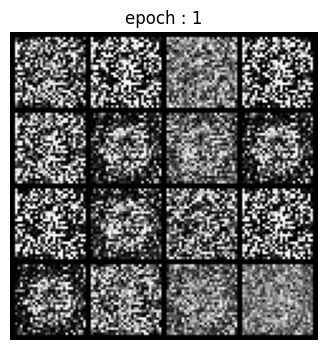

epoch:   1/200 	 D Loss: 0.231 G Loss: 3.002 	 14s


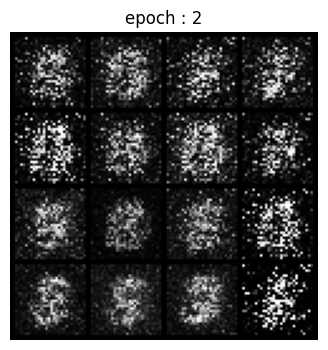

epoch:   2/200 	 D Loss: 0.228 G Loss: 3.945 	 14s


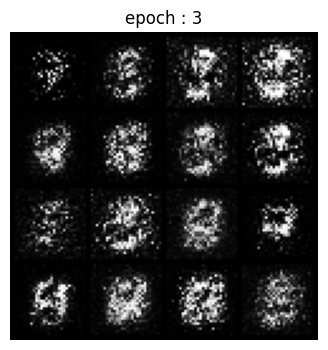

epoch:   3/200 	 D Loss: 0.359 G Loss: 2.801 	 13s


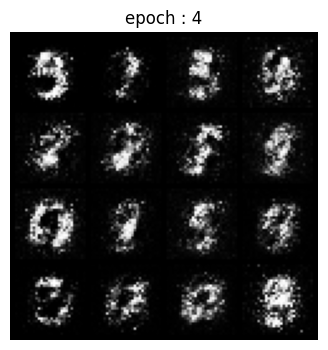

epoch:   4/200 	 D Loss: 0.451 G Loss: 2.010 	 13s


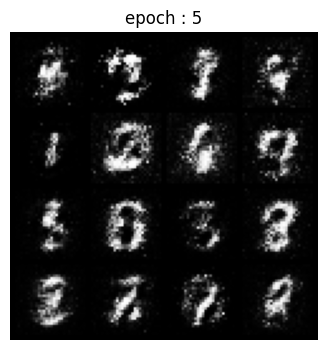

epoch:   5/200 	 D Loss: 0.520 G Loss: 1.465 	 13s


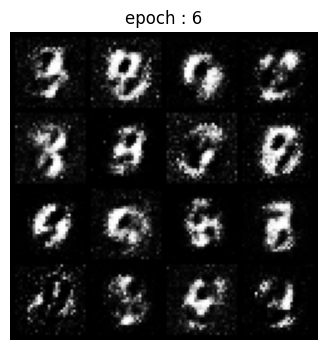

epoch:   6/200 	 D Loss: 0.565 G Loss: 1.180 	 13s


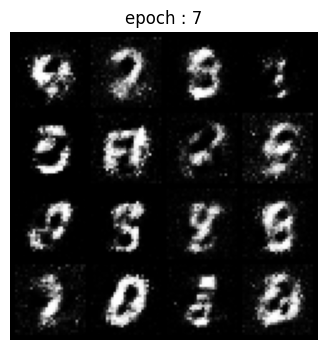

epoch:   7/200 	 D Loss: 0.573 G Loss: 1.134 	 13s


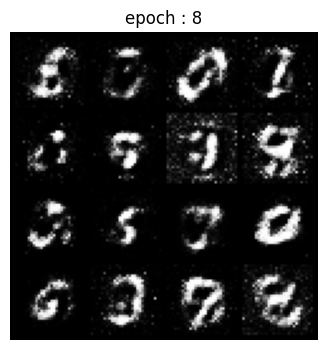

epoch:   8/200 	 D Loss: 0.588 G Loss: 1.080 	 13s


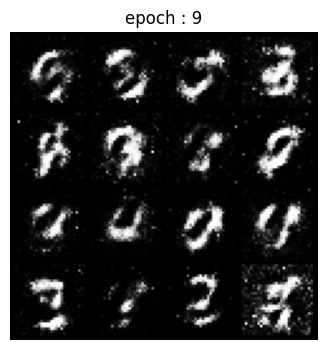

epoch:   9/200 	 D Loss: 0.565 G Loss: 1.171 	 12s


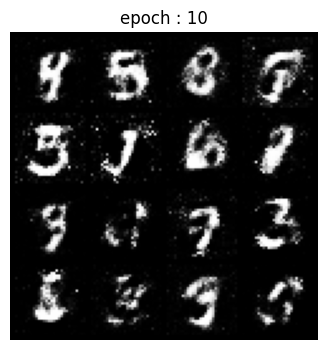

epoch:  10/200 	 D Loss: 0.552 G Loss: 1.245 	 12s


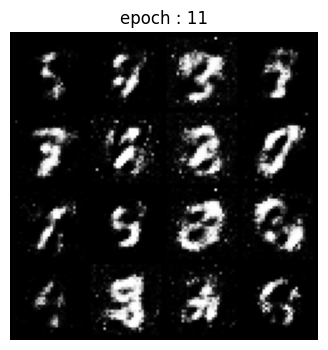

epoch:  11/200 	 D Loss: 0.548 G Loss: 1.251 	 17s


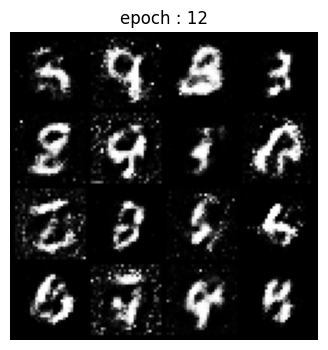

epoch:  12/200 	 D Loss: 0.558 G Loss: 1.212 	 15s


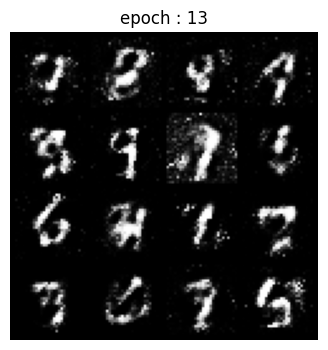

epoch:  13/200 	 D Loss: 0.566 G Loss: 1.183 	 14s


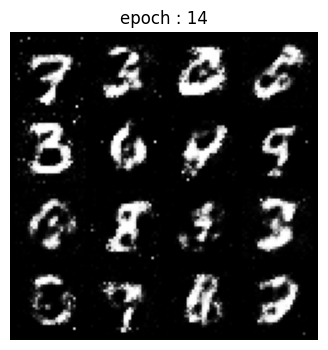

epoch:  14/200 	 D Loss: 0.566 G Loss: 1.178 	 14s


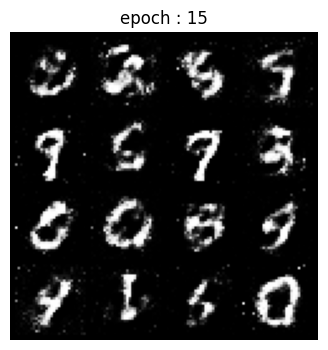

epoch:  15/200 	 D Loss: 0.564 G Loss: 1.185 	 15s


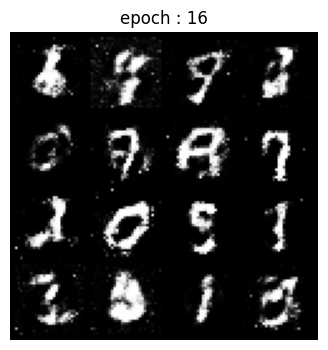

epoch:  16/200 	 D Loss: 0.569 G Loss: 1.163 	 16s


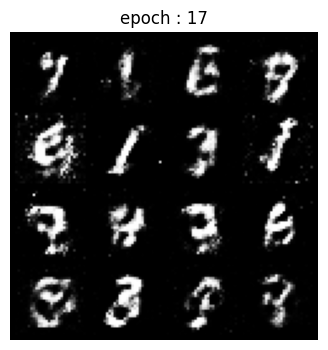

epoch:  17/200 	 D Loss: 0.572 G Loss: 1.169 	 13s


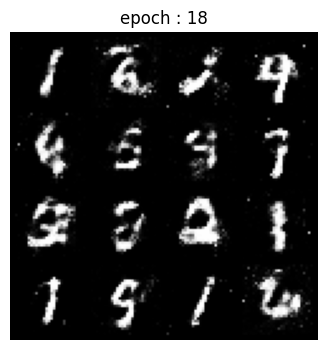

epoch:  18/200 	 D Loss: 0.574 G Loss: 1.147 	 14s


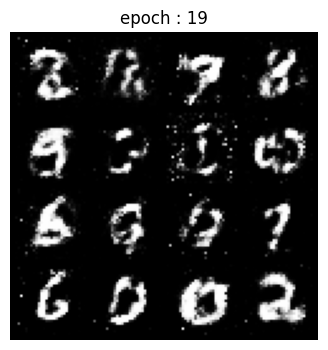

epoch:  19/200 	 D Loss: 0.582 G Loss: 1.112 	 15s


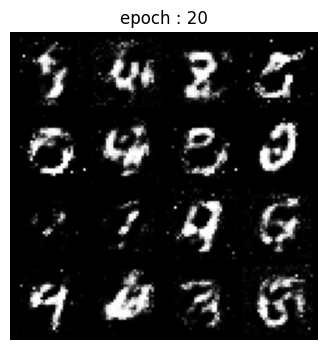

epoch:  20/200 	 D Loss: 0.587 G Loss: 1.108 	 17s


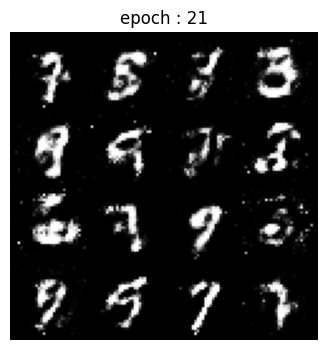

epoch:  21/200 	 D Loss: 0.593 G Loss: 1.088 	 16s


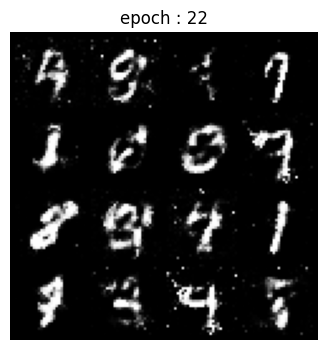

epoch:  22/200 	 D Loss: 0.593 G Loss: 1.088 	 14s


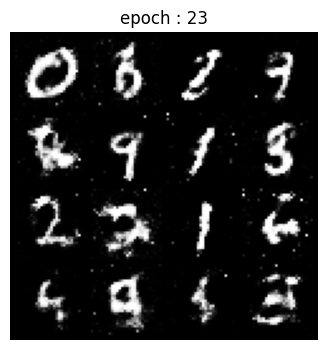

epoch:  23/200 	 D Loss: 0.598 G Loss: 1.065 	 13s


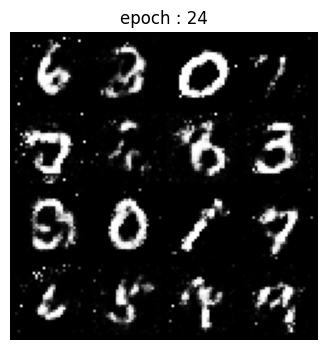

epoch:  24/200 	 D Loss: 0.604 G Loss: 1.059 	 12s


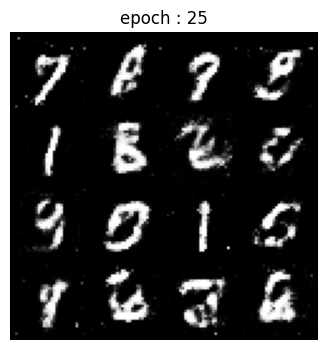

epoch:  25/200 	 D Loss: 0.608 G Loss: 1.034 	 13s


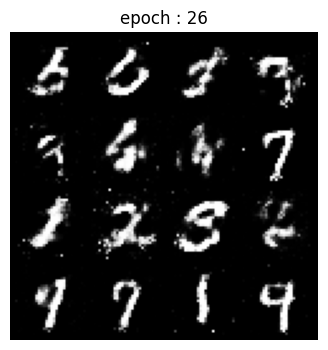

epoch:  26/200 	 D Loss: 0.614 G Loss: 1.014 	 15s


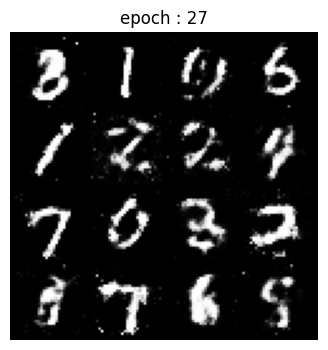

epoch:  27/200 	 D Loss: 0.622 G Loss: 0.977 	 14s


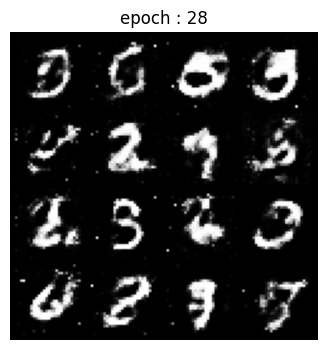

epoch:  28/200 	 D Loss: 0.626 G Loss: 0.971 	 15s


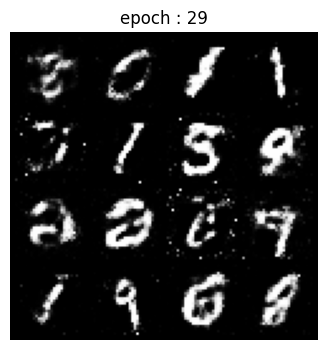

epoch:  29/200 	 D Loss: 0.625 G Loss: 0.983 	 15s


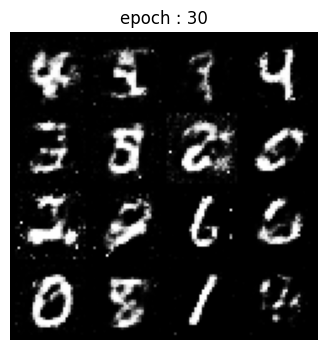

epoch:  30/200 	 D Loss: 0.630 G Loss: 0.961 	 13s


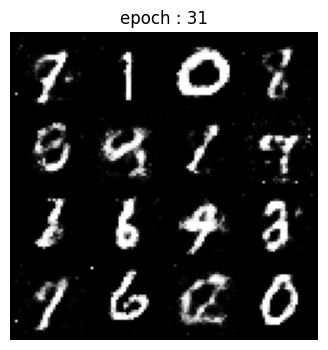

epoch:  31/200 	 D Loss: 0.635 G Loss: 0.937 	 13s


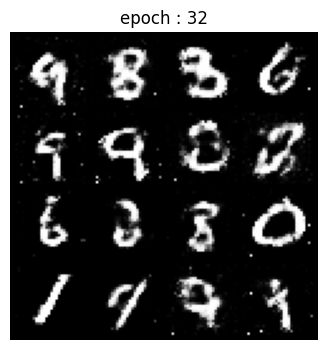

epoch:  32/200 	 D Loss: 0.640 G Loss: 0.935 	 14s


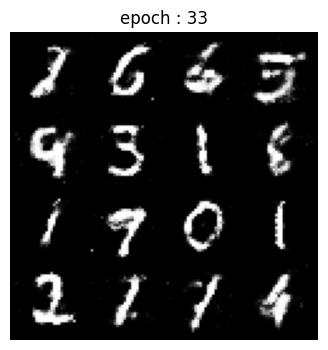

epoch:  33/200 	 D Loss: 0.643 G Loss: 0.925 	 15s


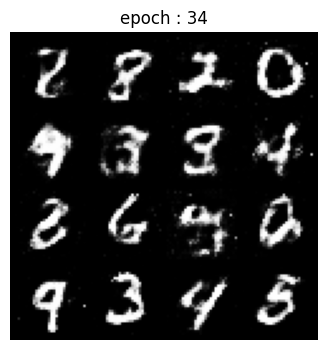

epoch:  34/200 	 D Loss: 0.647 G Loss: 0.890 	 15s


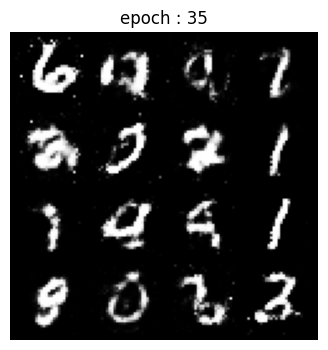

epoch:  35/200 	 D Loss: 0.649 G Loss: 0.900 	 13s


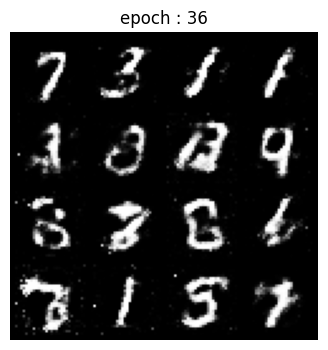

epoch:  36/200 	 D Loss: 0.647 G Loss: 0.914 	 12s


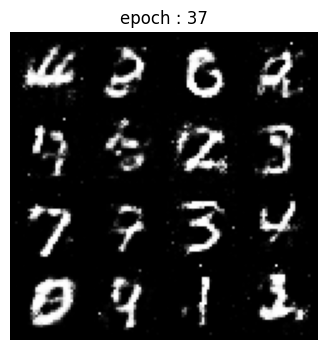

epoch:  37/200 	 D Loss: 0.649 G Loss: 0.893 	 13s


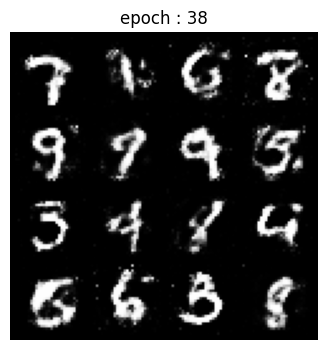

epoch:  38/200 	 D Loss: 0.650 G Loss: 0.896 	 13s


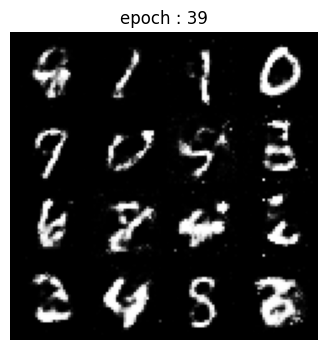

epoch:  39/200 	 D Loss: 0.651 G Loss: 0.884 	 14s


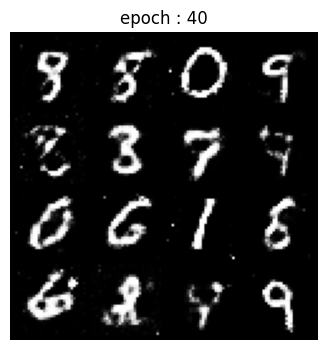

epoch:  40/200 	 D Loss: 0.656 G Loss: 0.878 	 14s


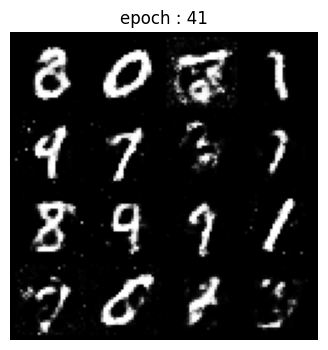

epoch:  41/200 	 D Loss: 0.654 G Loss: 0.884 	 14s


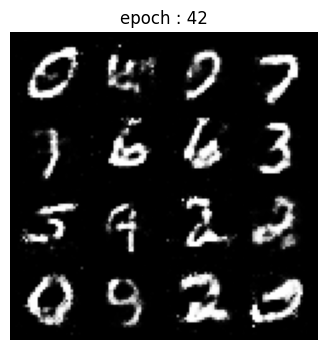

epoch:  42/200 	 D Loss: 0.660 G Loss: 0.866 	 13s


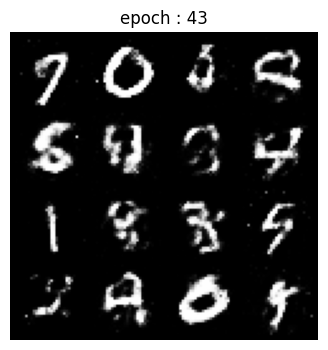

epoch:  43/200 	 D Loss: 0.660 G Loss: 0.868 	 13s


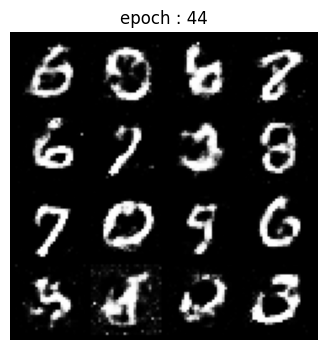

epoch:  44/200 	 D Loss: 0.660 G Loss: 0.861 	 14s


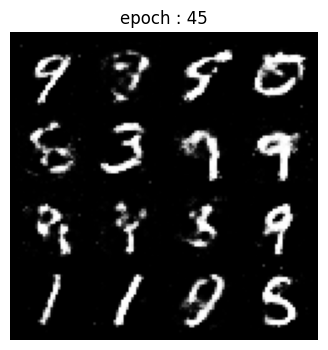

epoch:  45/200 	 D Loss: 0.659 G Loss: 0.869 	 12s


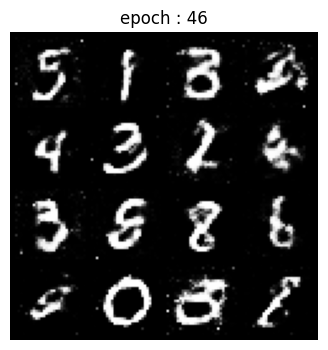

epoch:  46/200 	 D Loss: 0.663 G Loss: 0.853 	 12s


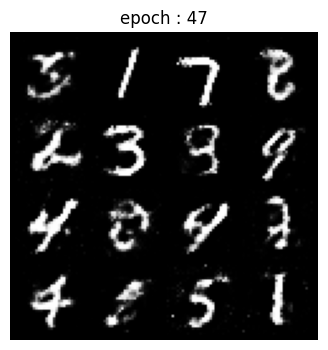

epoch:  47/200 	 D Loss: 0.661 G Loss: 0.864 	 12s


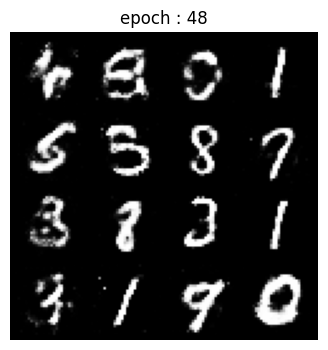

epoch:  48/200 	 D Loss: 0.661 G Loss: 0.862 	 12s


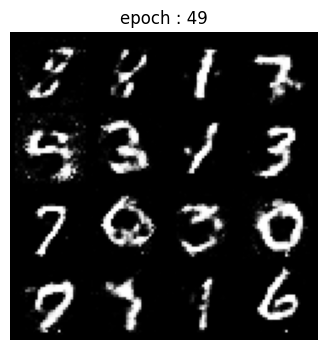

epoch:  49/200 	 D Loss: 0.662 G Loss: 0.853 	 12s


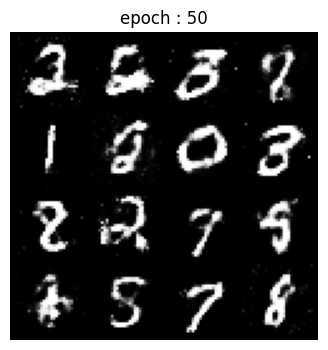

epoch:  50/200 	 D Loss: 0.661 G Loss: 0.857 	 12s


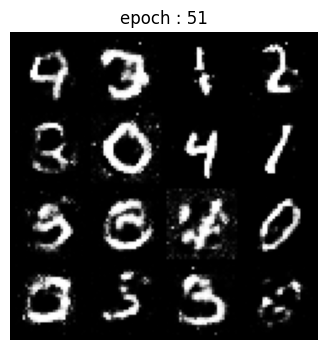

epoch:  51/200 	 D Loss: 0.663 G Loss: 0.856 	 12s


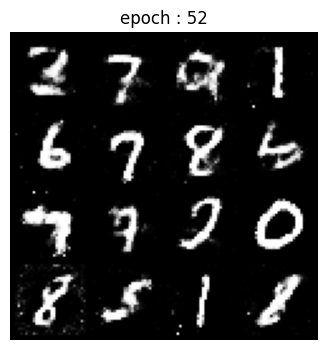

epoch:  52/200 	 D Loss: 0.663 G Loss: 0.851 	 12s


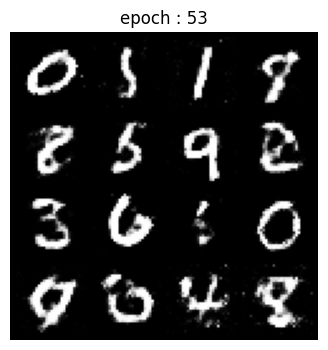

epoch:  53/200 	 D Loss: 0.660 G Loss: 0.863 	 12s


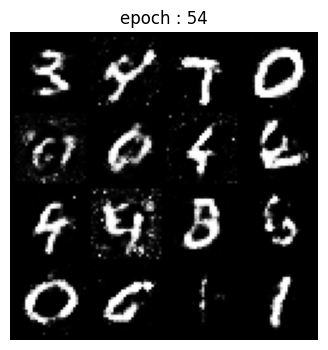

epoch:  54/200 	 D Loss: 0.664 G Loss: 0.848 	 12s


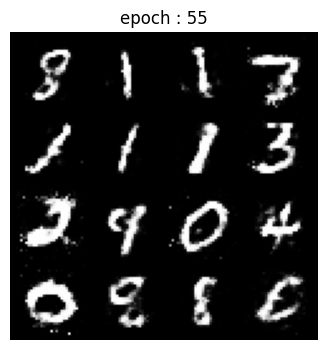

epoch:  55/200 	 D Loss: 0.665 G Loss: 0.846 	 12s


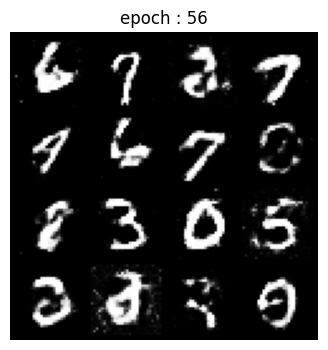

epoch:  56/200 	 D Loss: 0.667 G Loss: 0.842 	 12s


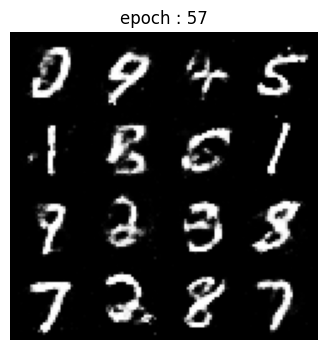

epoch:  57/200 	 D Loss: 0.666 G Loss: 0.842 	 12s


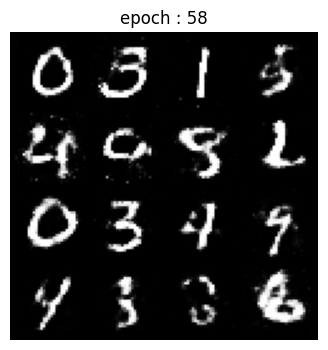

epoch:  58/200 	 D Loss: 0.670 G Loss: 0.828 	 12s


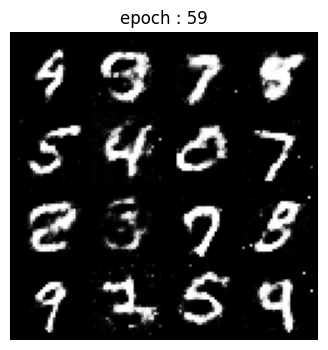

epoch:  59/200 	 D Loss: 0.666 G Loss: 0.844 	 12s


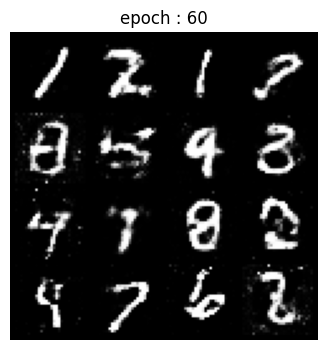

epoch:  60/200 	 D Loss: 0.664 G Loss: 0.849 	 12s


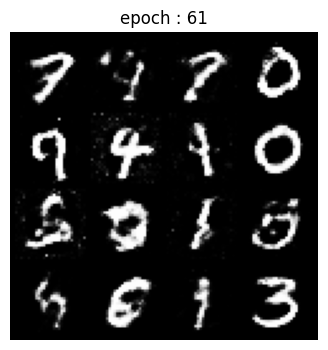

epoch:  61/200 	 D Loss: 0.666 G Loss: 0.838 	 12s


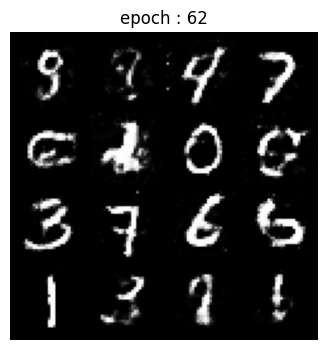

epoch:  62/200 	 D Loss: 0.665 G Loss: 0.844 	 12s


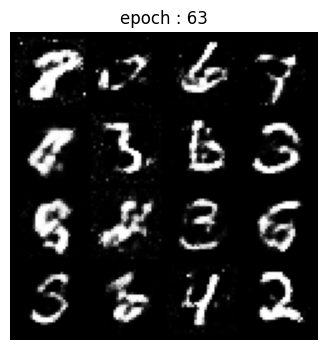

epoch:  63/200 	 D Loss: 0.669 G Loss: 0.831 	 13s


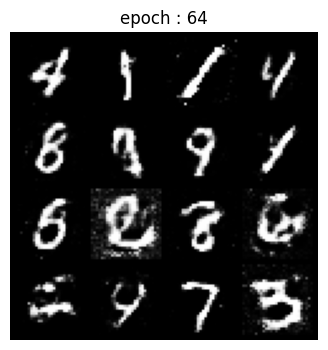

epoch:  64/200 	 D Loss: 0.666 G Loss: 0.842 	 14s


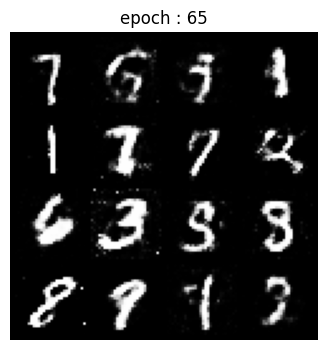

epoch:  65/200 	 D Loss: 0.666 G Loss: 0.841 	 14s


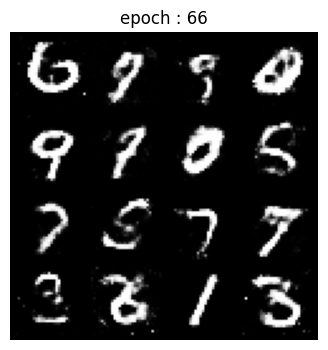

epoch:  66/200 	 D Loss: 0.666 G Loss: 0.837 	 14s


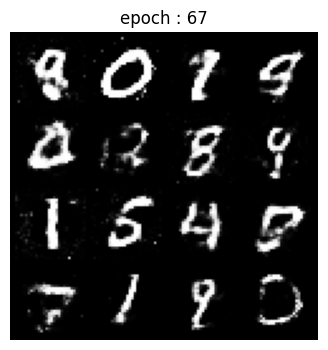

epoch:  67/200 	 D Loss: 0.669 G Loss: 0.829 	 14s


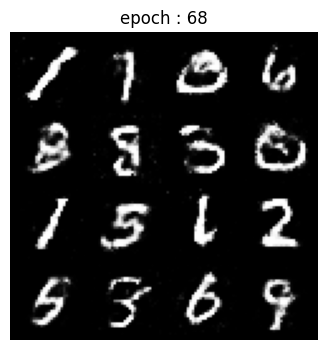

epoch:  68/200 	 D Loss: 0.667 G Loss: 0.837 	 13s


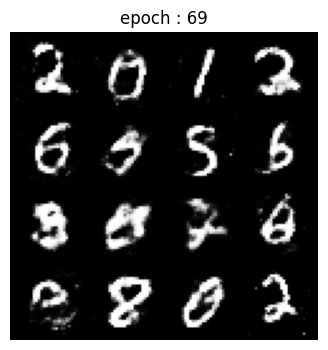

epoch:  69/200 	 D Loss: 0.669 G Loss: 0.831 	 14s


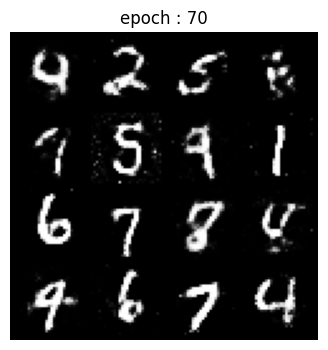

epoch:  70/200 	 D Loss: 0.668 G Loss: 0.840 	 13s


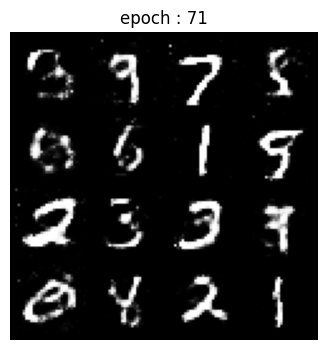

epoch:  71/200 	 D Loss: 0.671 G Loss: 0.820 	 13s


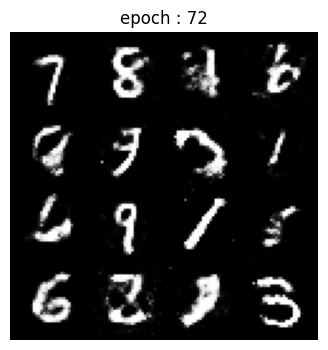

epoch:  72/200 	 D Loss: 0.671 G Loss: 0.826 	 14s


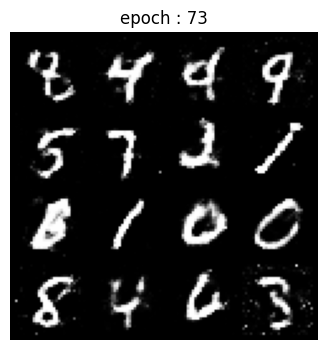

epoch:  73/200 	 D Loss: 0.667 G Loss: 0.836 	 13s


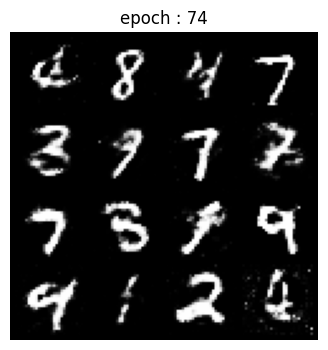

epoch:  74/200 	 D Loss: 0.667 G Loss: 0.836 	 13s


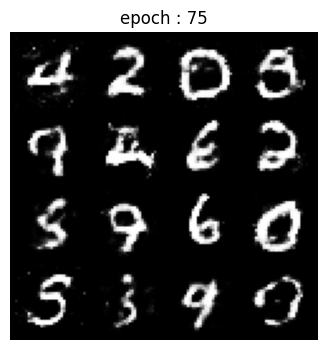

epoch:  75/200 	 D Loss: 0.667 G Loss: 0.834 	 14s


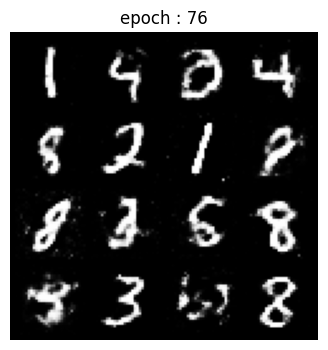

epoch:  76/200 	 D Loss: 0.666 G Loss: 0.839 	 14s


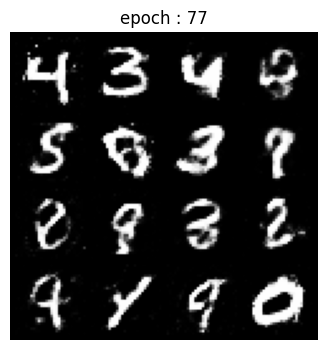

epoch:  77/200 	 D Loss: 0.669 G Loss: 0.833 	 13s


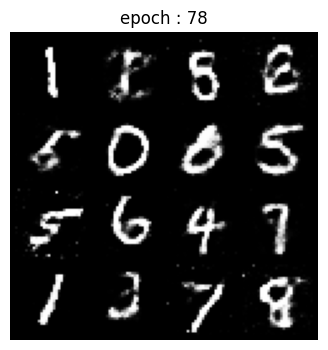

epoch:  78/200 	 D Loss: 0.671 G Loss: 0.825 	 13s


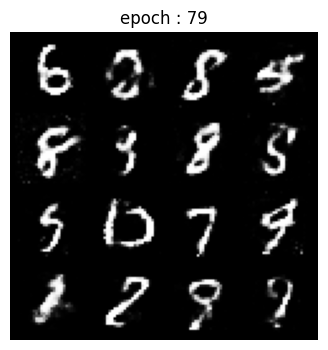

epoch:  79/200 	 D Loss: 0.666 G Loss: 0.835 	 13s


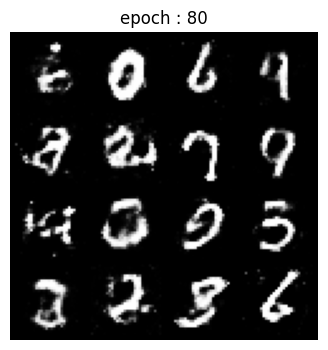

epoch:  80/200 	 D Loss: 0.668 G Loss: 0.828 	 13s


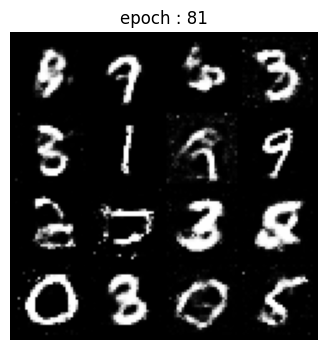

epoch:  81/200 	 D Loss: 0.667 G Loss: 0.842 	 13s


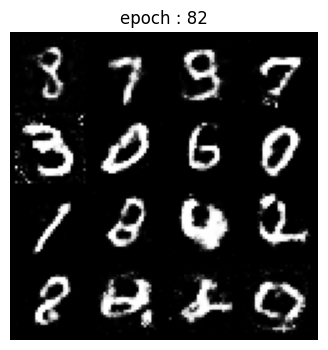

epoch:  82/200 	 D Loss: 0.667 G Loss: 0.836 	 13s


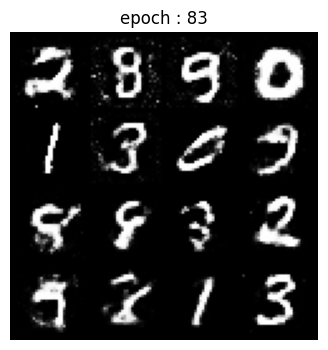

epoch:  83/200 	 D Loss: 0.669 G Loss: 0.830 	 14s


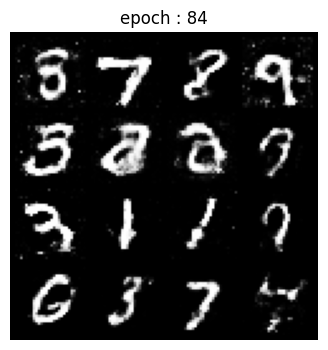

epoch:  84/200 	 D Loss: 0.667 G Loss: 0.836 	 14s


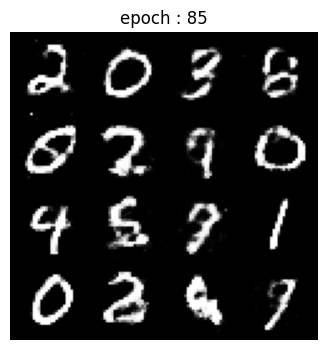

epoch:  85/200 	 D Loss: 0.667 G Loss: 0.836 	 13s


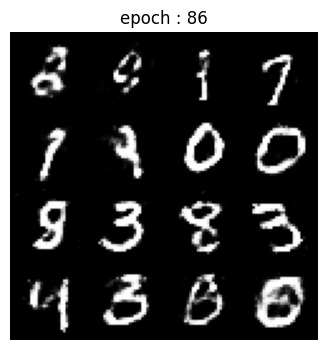

epoch:  86/200 	 D Loss: 0.670 G Loss: 0.827 	 13s


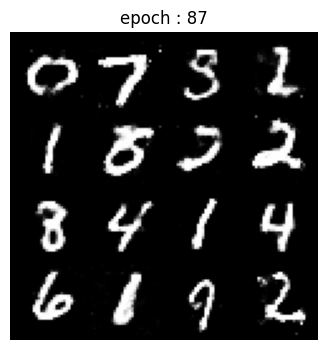

epoch:  87/200 	 D Loss: 0.668 G Loss: 0.829 	 14s


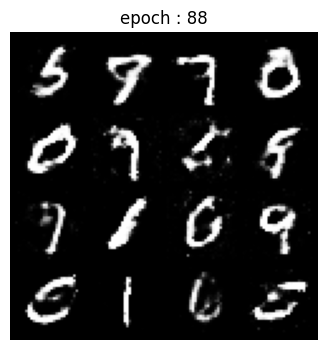

epoch:  88/200 	 D Loss: 0.670 G Loss: 0.827 	 14s


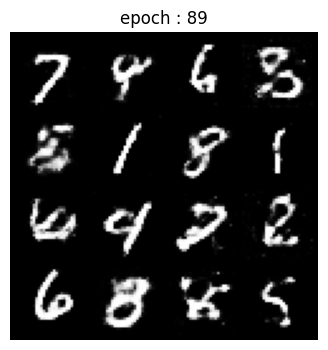

epoch:  89/200 	 D Loss: 0.671 G Loss: 0.827 	 14s


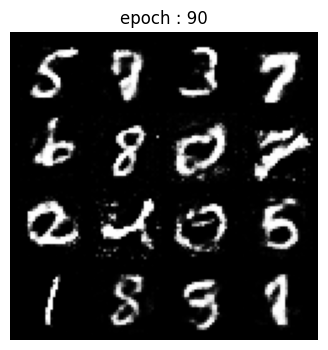

epoch:  90/200 	 D Loss: 0.669 G Loss: 0.834 	 15s


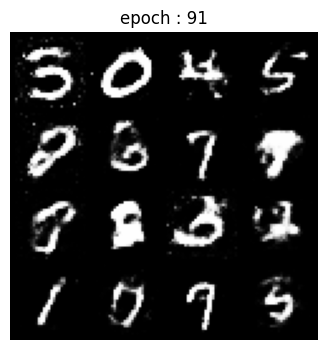

epoch:  91/200 	 D Loss: 0.669 G Loss: 0.827 	 15s


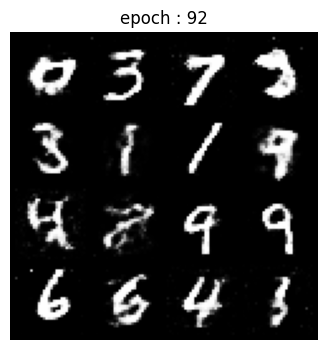

epoch:  92/200 	 D Loss: 0.667 G Loss: 0.838 	 13s


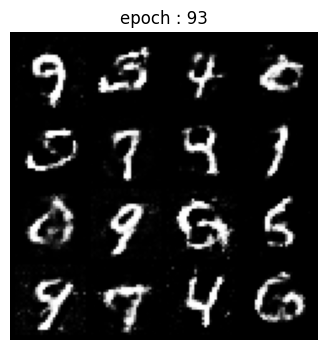

epoch:  93/200 	 D Loss: 0.669 G Loss: 0.833 	 13s


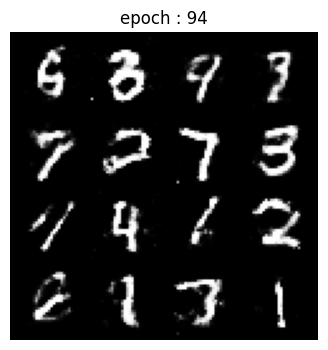

epoch:  94/200 	 D Loss: 0.670 G Loss: 0.826 	 14s


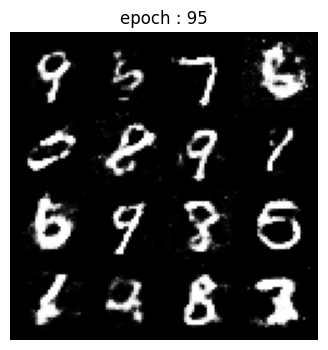

epoch:  95/200 	 D Loss: 0.669 G Loss: 0.829 	 14s


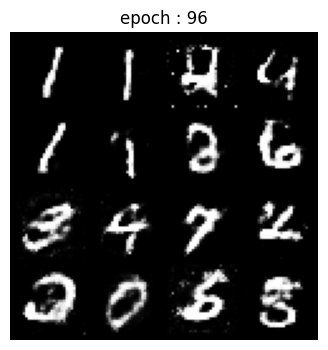

epoch:  96/200 	 D Loss: 0.673 G Loss: 0.822 	 14s


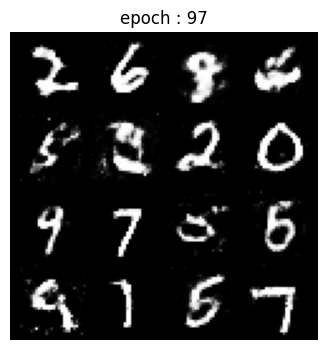

epoch:  97/200 	 D Loss: 0.670 G Loss: 0.832 	 14s


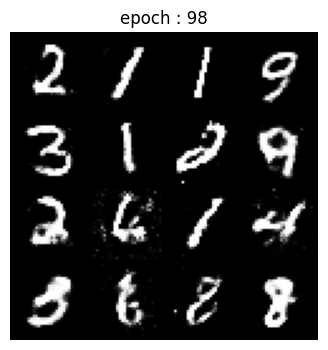

epoch:  98/200 	 D Loss: 0.668 G Loss: 0.836 	 14s


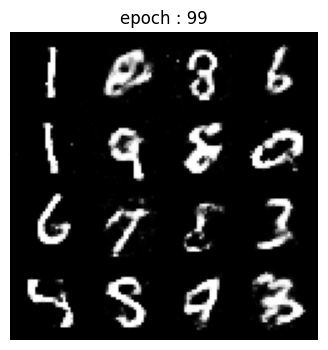

epoch:  99/200 	 D Loss: 0.667 G Loss: 0.837 	 14s


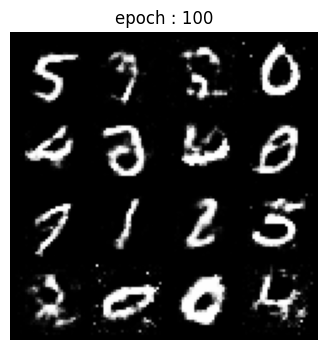

epoch: 100/200 	 D Loss: 0.668 G Loss: 0.832 	 14s


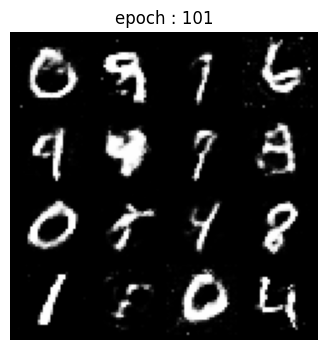

epoch: 101/200 	 D Loss: 0.669 G Loss: 0.833 	 14s


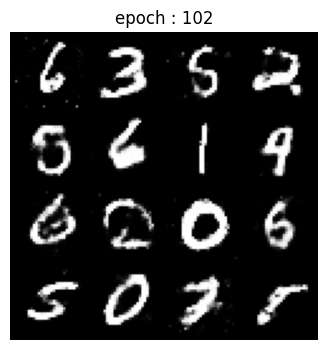

epoch: 102/200 	 D Loss: 0.668 G Loss: 0.827 	 14s


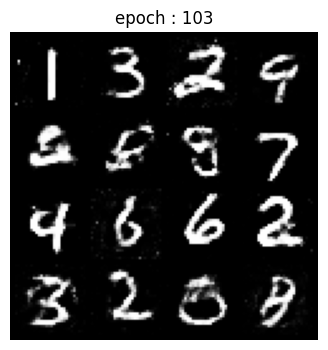

epoch: 103/200 	 D Loss: 0.669 G Loss: 0.831 	 14s


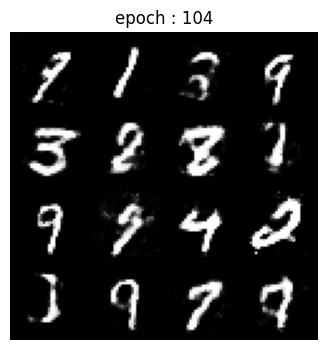

epoch: 104/200 	 D Loss: 0.671 G Loss: 0.827 	 14s


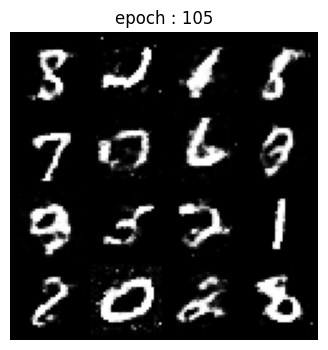

epoch: 105/200 	 D Loss: 0.669 G Loss: 0.828 	 14s


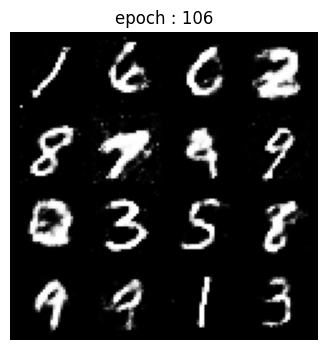

epoch: 106/200 	 D Loss: 0.668 G Loss: 0.828 	 14s


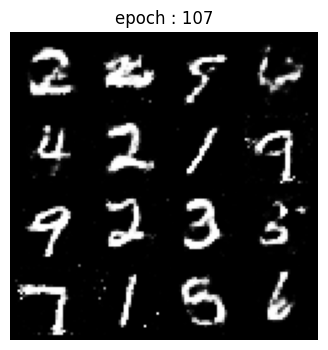

epoch: 107/200 	 D Loss: 0.670 G Loss: 0.827 	 13s


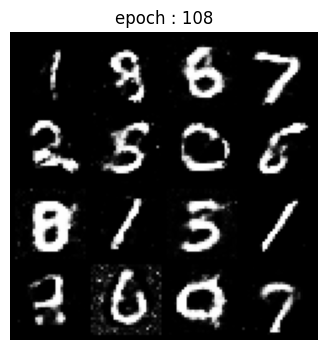

epoch: 108/200 	 D Loss: 0.670 G Loss: 0.831 	 14s


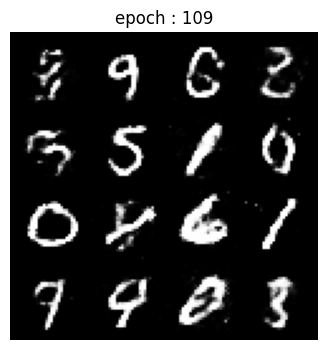

epoch: 109/200 	 D Loss: 0.670 G Loss: 0.834 	 13s


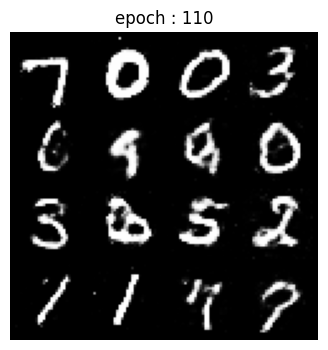

epoch: 110/200 	 D Loss: 0.668 G Loss: 0.834 	 12s


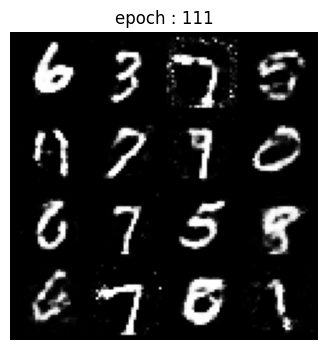

epoch: 111/200 	 D Loss: 0.668 G Loss: 0.832 	 13s


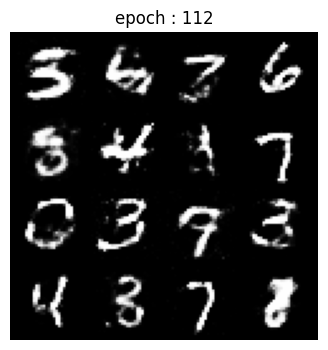

epoch: 112/200 	 D Loss: 0.669 G Loss: 0.828 	 13s


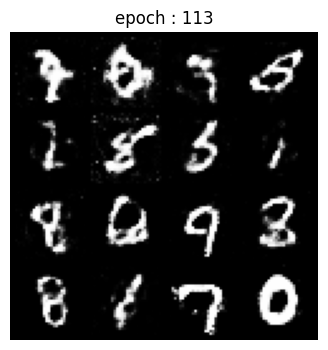

epoch: 113/200 	 D Loss: 0.669 G Loss: 0.831 	 12s


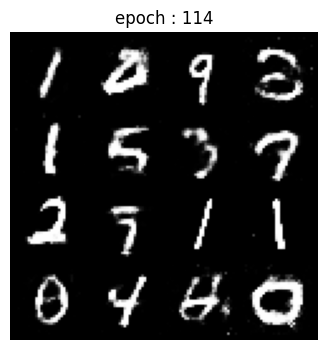

epoch: 114/200 	 D Loss: 0.668 G Loss: 0.828 	 12s


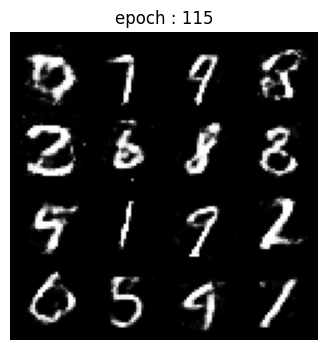

epoch: 115/200 	 D Loss: 0.669 G Loss: 0.835 	 12s


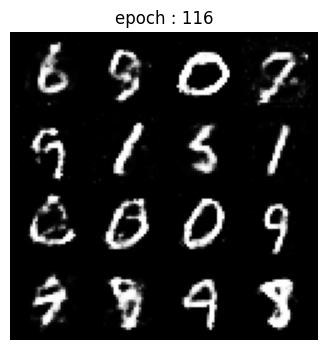

epoch: 116/200 	 D Loss: 0.670 G Loss: 0.826 	 13s


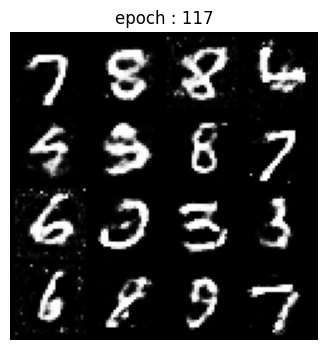

epoch: 117/200 	 D Loss: 0.668 G Loss: 0.834 	 12s


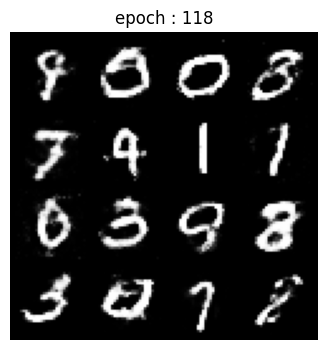

epoch: 118/200 	 D Loss: 0.669 G Loss: 0.826 	 12s


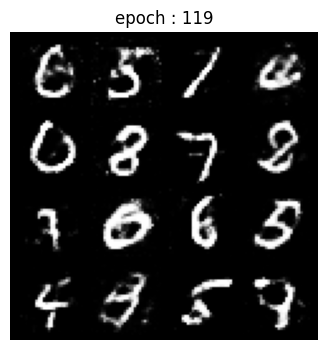

epoch: 119/200 	 D Loss: 0.671 G Loss: 0.819 	 12s


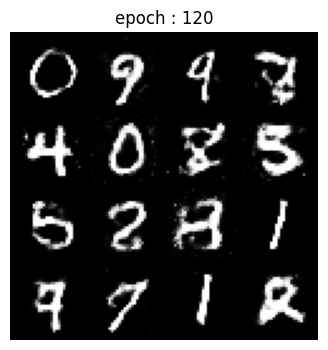

epoch: 120/200 	 D Loss: 0.669 G Loss: 0.835 	 14s


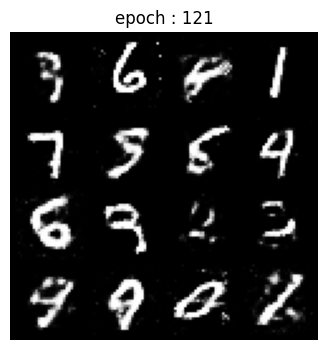

epoch: 121/200 	 D Loss: 0.669 G Loss: 0.828 	 13s


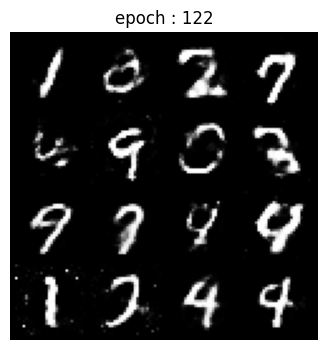

epoch: 122/200 	 D Loss: 0.670 G Loss: 0.821 	 14s


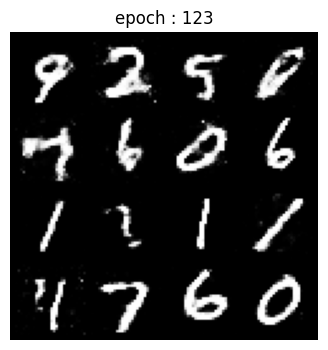

epoch: 123/200 	 D Loss: 0.671 G Loss: 0.827 	 15s


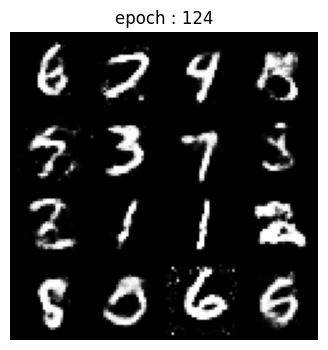

epoch: 124/200 	 D Loss: 0.670 G Loss: 0.831 	 15s


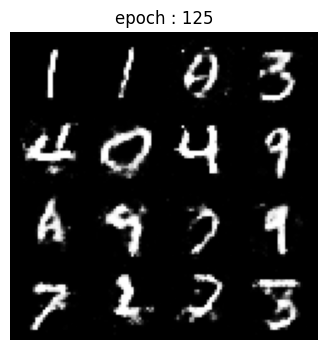

epoch: 125/200 	 D Loss: 0.670 G Loss: 0.827 	 13s


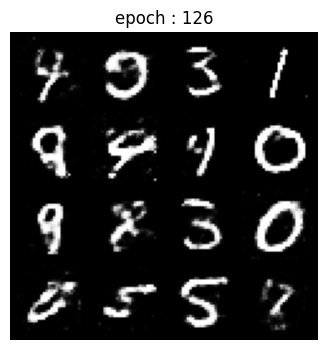

epoch: 126/200 	 D Loss: 0.670 G Loss: 0.830 	 13s


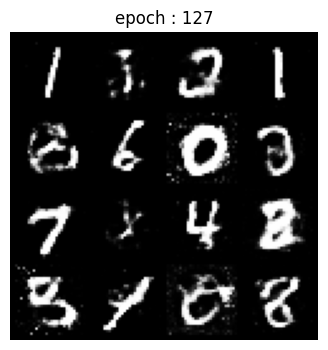

epoch: 127/200 	 D Loss: 0.669 G Loss: 0.835 	 13s


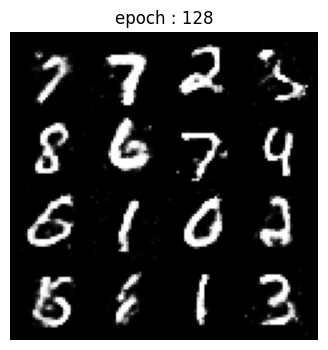

epoch: 128/200 	 D Loss: 0.671 G Loss: 0.819 	 14s


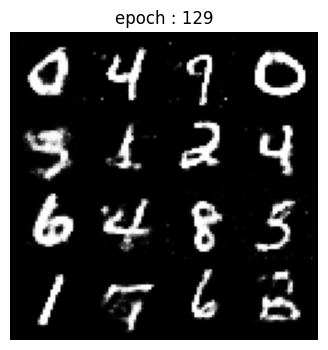

epoch: 129/200 	 D Loss: 0.671 G Loss: 0.827 	 14s


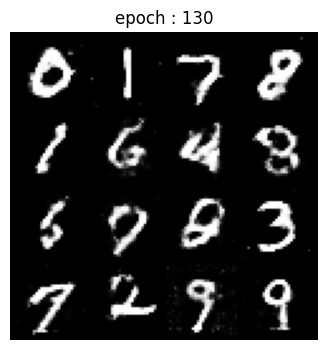

epoch: 130/200 	 D Loss: 0.670 G Loss: 0.829 	 14s


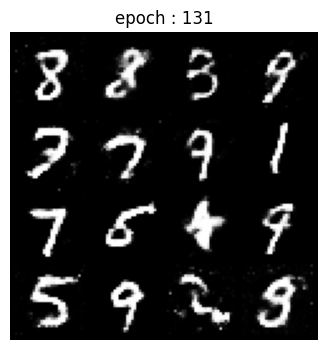

epoch: 131/200 	 D Loss: 0.672 G Loss: 0.817 	 13s


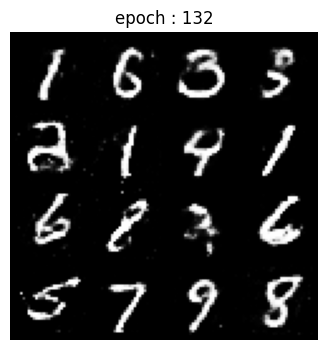

epoch: 132/200 	 D Loss: 0.670 G Loss: 0.825 	 13s


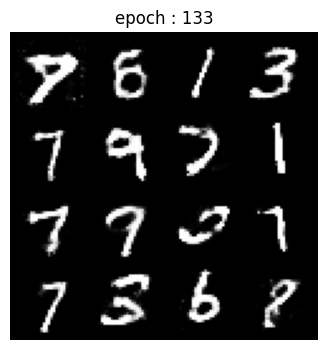

epoch: 133/200 	 D Loss: 0.673 G Loss: 0.822 	 13s


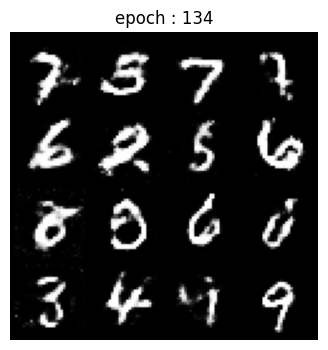

epoch: 134/200 	 D Loss: 0.671 G Loss: 0.824 	 13s


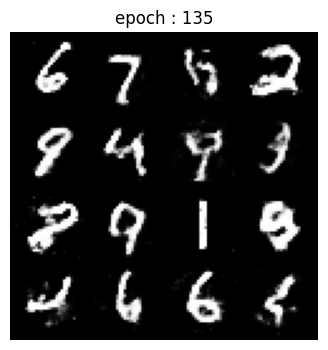

epoch: 135/200 	 D Loss: 0.671 G Loss: 0.826 	 13s


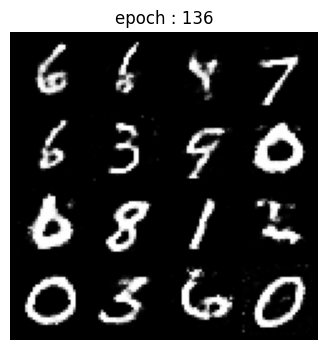

epoch: 136/200 	 D Loss: 0.672 G Loss: 0.818 	 17s


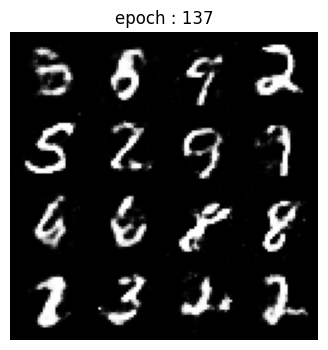

epoch: 137/200 	 D Loss: 0.670 G Loss: 0.827 	 17s


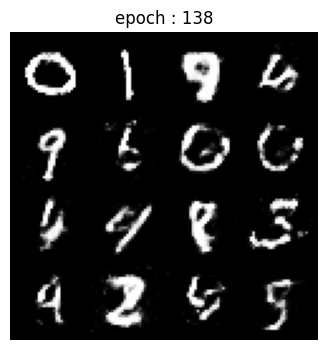

epoch: 138/200 	 D Loss: 0.674 G Loss: 0.816 	 17s


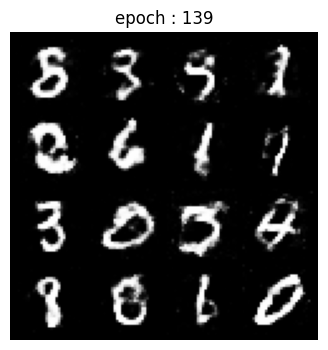

epoch: 139/200 	 D Loss: 0.672 G Loss: 0.821 	 17s


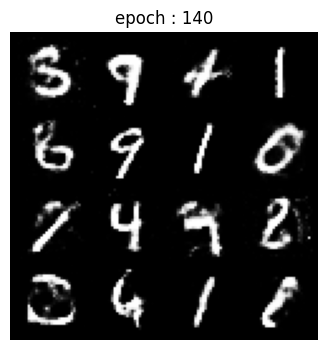

epoch: 140/200 	 D Loss: 0.669 G Loss: 0.830 	 17s


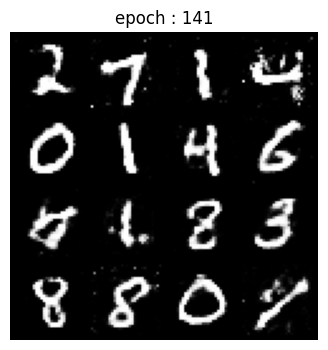

epoch: 141/200 	 D Loss: 0.671 G Loss: 0.816 	 17s


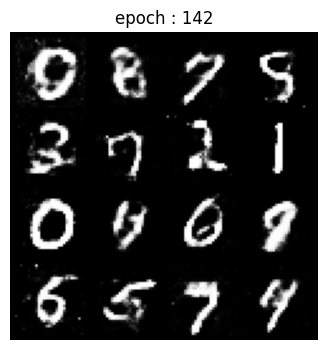

epoch: 142/200 	 D Loss: 0.671 G Loss: 0.823 	 15s


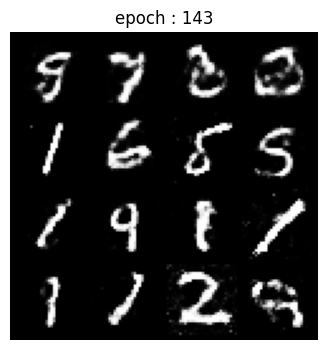

epoch: 143/200 	 D Loss: 0.673 G Loss: 0.819 	 16s


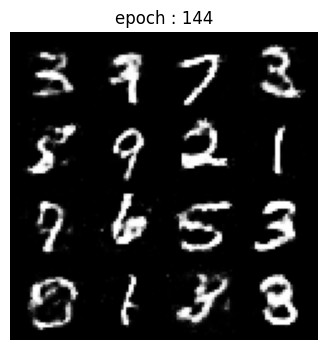

epoch: 144/200 	 D Loss: 0.670 G Loss: 0.830 	 17s


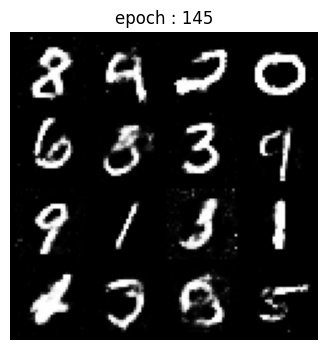

epoch: 145/200 	 D Loss: 0.673 G Loss: 0.818 	 17s


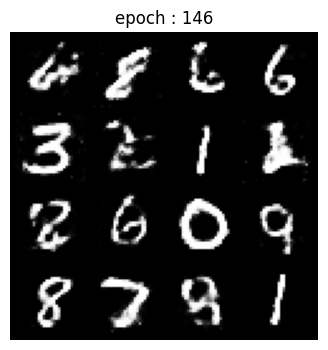

epoch: 146/200 	 D Loss: 0.673 G Loss: 0.815 	 17s


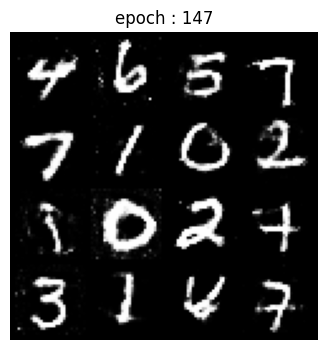

epoch: 147/200 	 D Loss: 0.673 G Loss: 0.823 	 16s


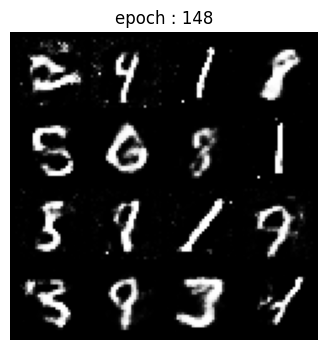

epoch: 148/200 	 D Loss: 0.671 G Loss: 0.824 	 17s


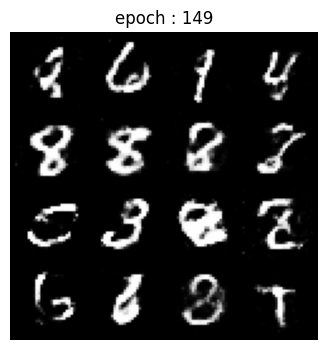

epoch: 149/200 	 D Loss: 0.672 G Loss: 0.825 	 16s


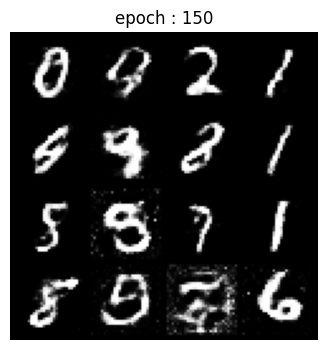

epoch: 150/200 	 D Loss: 0.671 G Loss: 0.825 	 16s


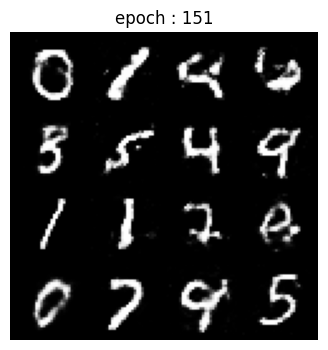

epoch: 151/200 	 D Loss: 0.672 G Loss: 0.828 	 16s


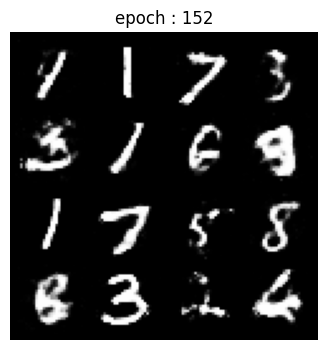

epoch: 152/200 	 D Loss: 0.672 G Loss: 0.823 	 16s


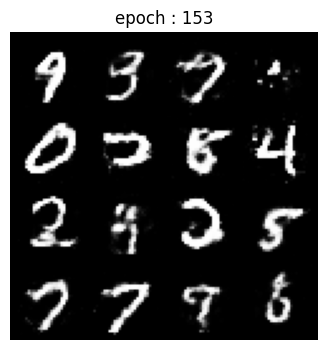

epoch: 153/200 	 D Loss: 0.671 G Loss: 0.828 	 15s


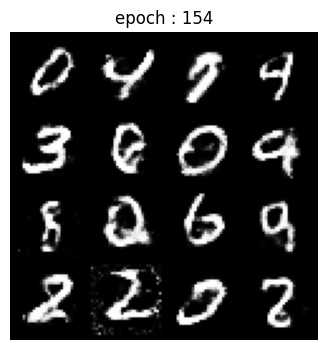

epoch: 154/200 	 D Loss: 0.673 G Loss: 0.825 	 15s


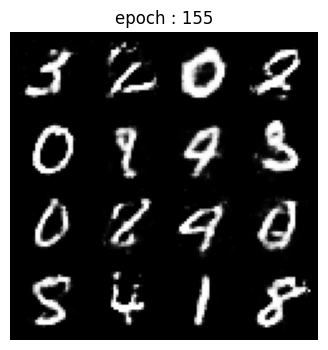

epoch: 155/200 	 D Loss: 0.671 G Loss: 0.824 	 16s


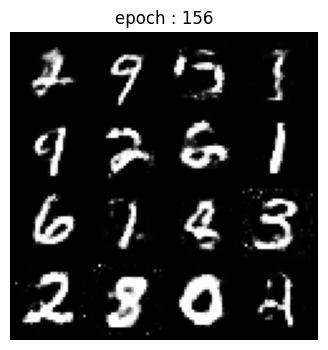

epoch: 156/200 	 D Loss: 0.672 G Loss: 0.825 	 15s


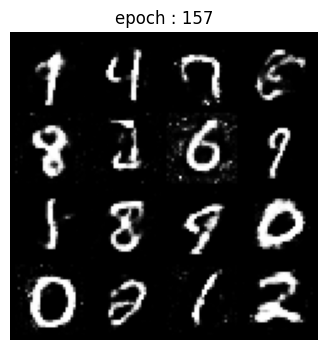

epoch: 157/200 	 D Loss: 0.672 G Loss: 0.823 	 16s


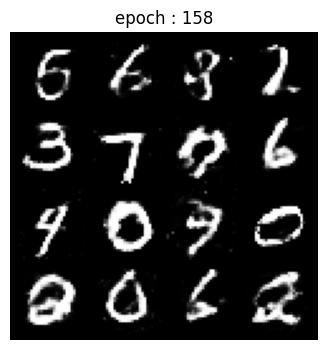

epoch: 158/200 	 D Loss: 0.669 G Loss: 0.827 	 15s


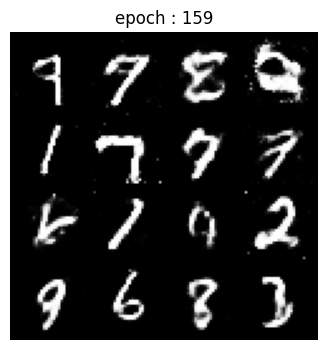

epoch: 159/200 	 D Loss: 0.673 G Loss: 0.814 	 15s


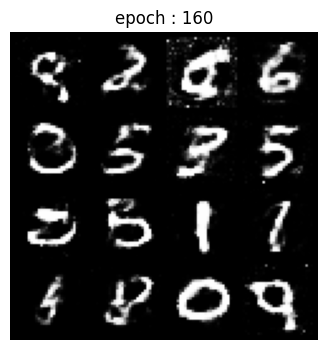

epoch: 160/200 	 D Loss: 0.672 G Loss: 0.822 	 16s


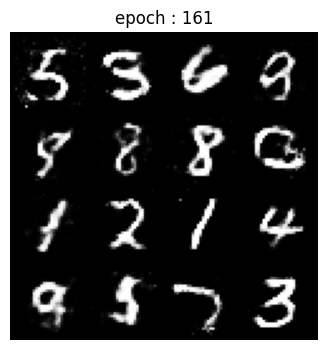

epoch: 161/200 	 D Loss: 0.673 G Loss: 0.820 	 15s


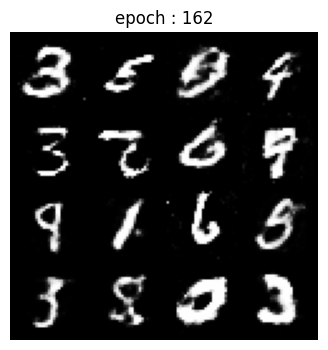

epoch: 162/200 	 D Loss: 0.670 G Loss: 0.831 	 17s


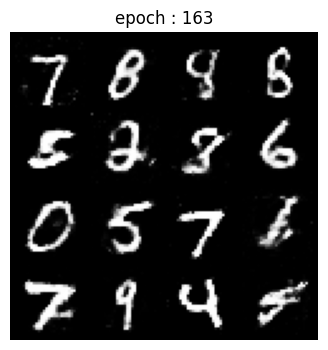

epoch: 163/200 	 D Loss: 0.672 G Loss: 0.819 	 17s


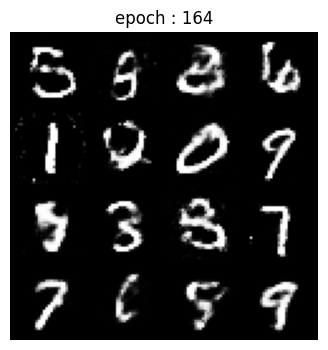

epoch: 164/200 	 D Loss: 0.672 G Loss: 0.823 	 14s


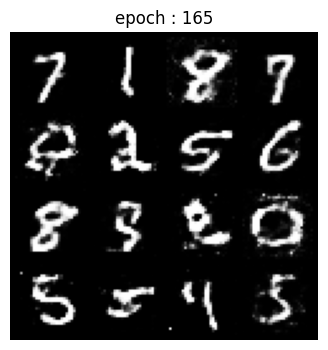

epoch: 165/200 	 D Loss: 0.669 G Loss: 0.834 	 13s


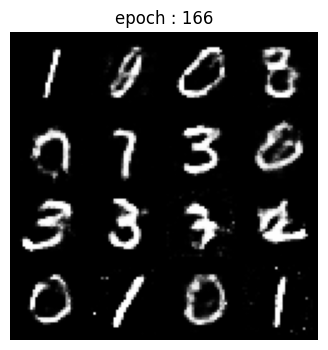

epoch: 166/200 	 D Loss: 0.671 G Loss: 0.830 	 13s


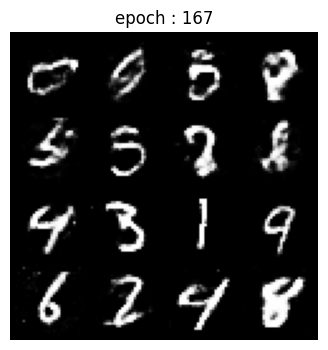

epoch: 167/200 	 D Loss: 0.673 G Loss: 0.819 	 13s


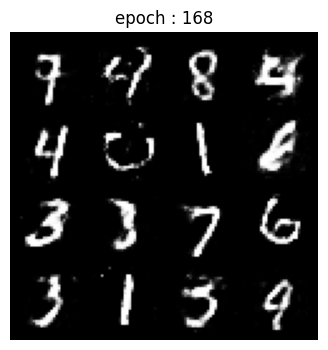

epoch: 168/200 	 D Loss: 0.672 G Loss: 0.821 	 14s


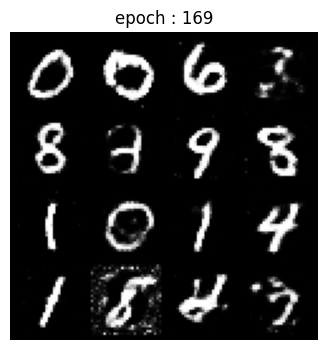

epoch: 169/200 	 D Loss: 0.671 G Loss: 0.830 	 13s


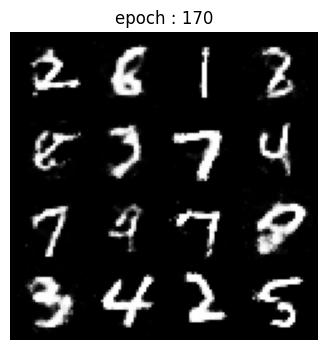

epoch: 170/200 	 D Loss: 0.669 G Loss: 0.828 	 14s


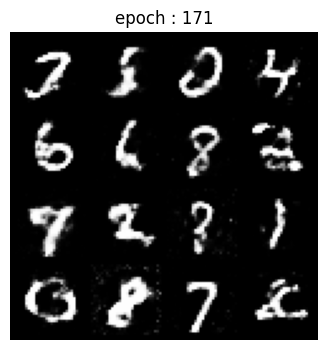

epoch: 171/200 	 D Loss: 0.670 G Loss: 0.826 	 13s


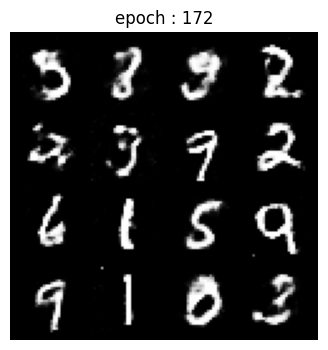

epoch: 172/200 	 D Loss: 0.671 G Loss: 0.828 	 13s


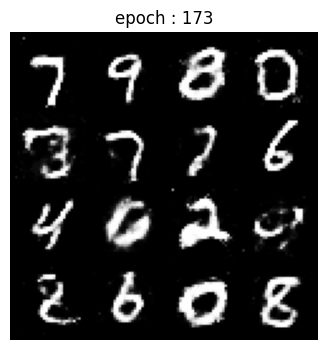

epoch: 173/200 	 D Loss: 0.671 G Loss: 0.826 	 13s


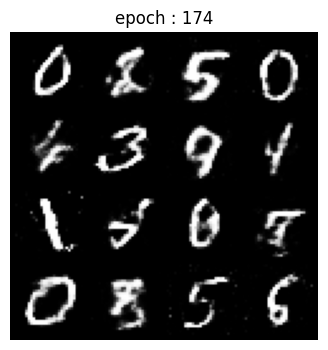

epoch: 174/200 	 D Loss: 0.670 G Loss: 0.823 	 13s


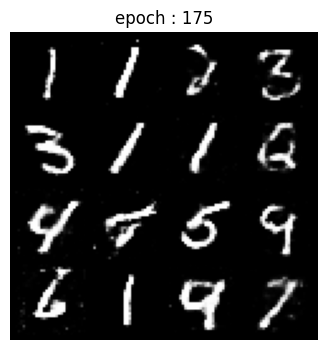

epoch: 175/200 	 D Loss: 0.672 G Loss: 0.821 	 12s


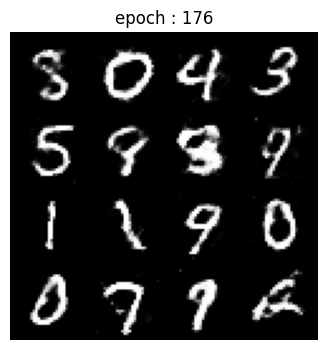

epoch: 176/200 	 D Loss: 0.673 G Loss: 0.821 	 13s


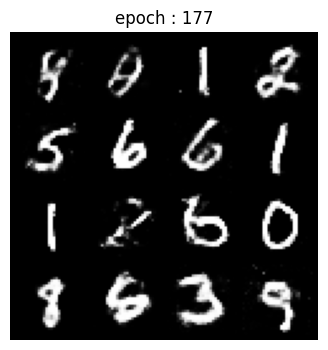

epoch: 177/200 	 D Loss: 0.670 G Loss: 0.824 	 13s


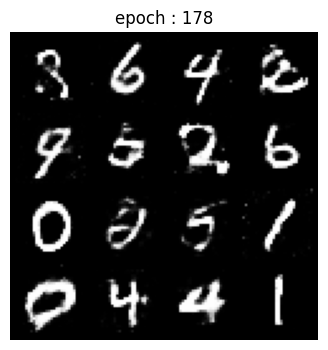

epoch: 178/200 	 D Loss: 0.673 G Loss: 0.819 	 12s


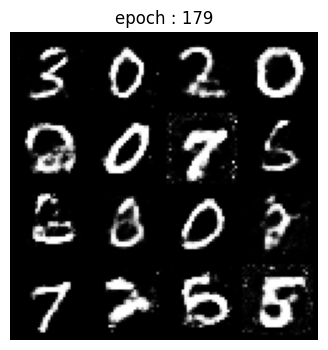

epoch: 179/200 	 D Loss: 0.673 G Loss: 0.818 	 13s


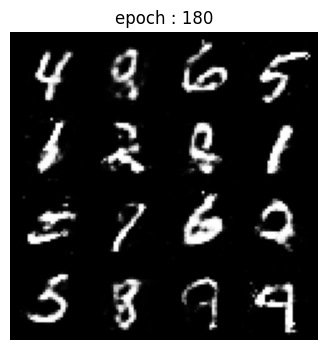

epoch: 180/200 	 D Loss: 0.672 G Loss: 0.820 	 12s


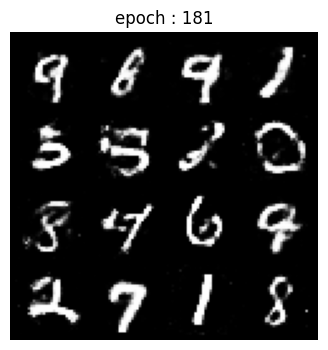

epoch: 181/200 	 D Loss: 0.672 G Loss: 0.815 	 13s


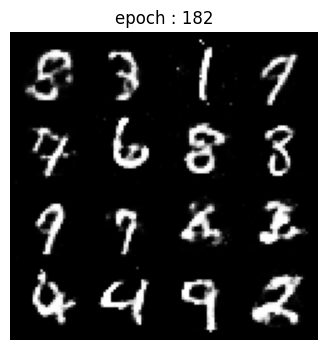

epoch: 182/200 	 D Loss: 0.673 G Loss: 0.814 	 14s


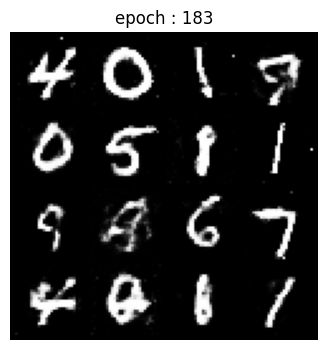

epoch: 183/200 	 D Loss: 0.671 G Loss: 0.833 	 14s


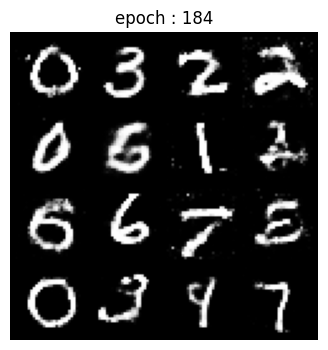

epoch: 184/200 	 D Loss: 0.672 G Loss: 0.817 	 14s


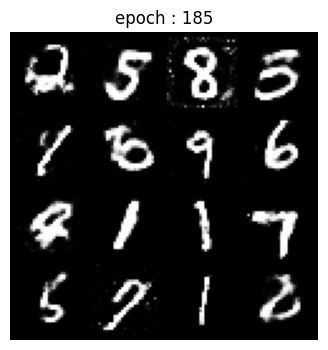

epoch: 185/200 	 D Loss: 0.672 G Loss: 0.815 	 14s


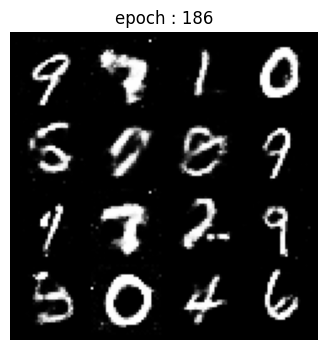

epoch: 186/200 	 D Loss: 0.675 G Loss: 0.819 	 14s


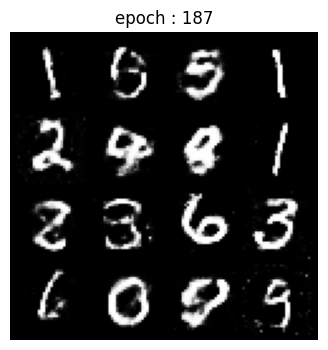

epoch: 187/200 	 D Loss: 0.671 G Loss: 0.827 	 14s


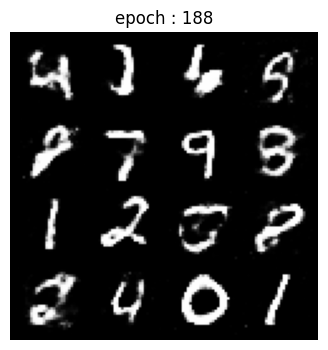

epoch: 188/200 	 D Loss: 0.673 G Loss: 0.813 	 14s


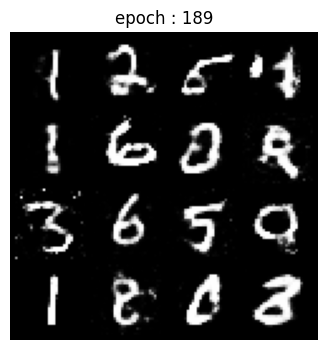

epoch: 189/200 	 D Loss: 0.672 G Loss: 0.816 	 14s


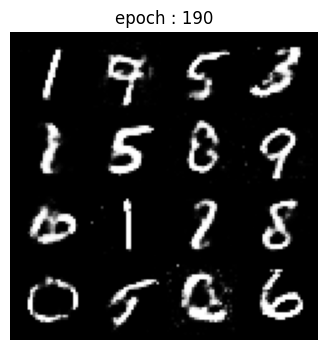

epoch: 190/200 	 D Loss: 0.672 G Loss: 0.830 	 14s


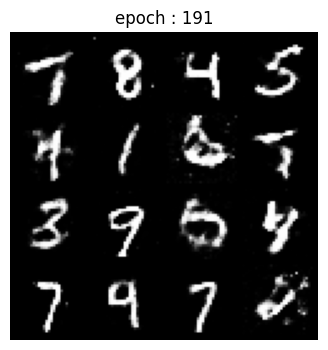

epoch: 191/200 	 D Loss: 0.672 G Loss: 0.818 	 14s


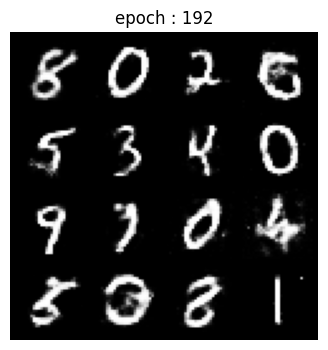

epoch: 192/200 	 D Loss: 0.673 G Loss: 0.821 	 14s


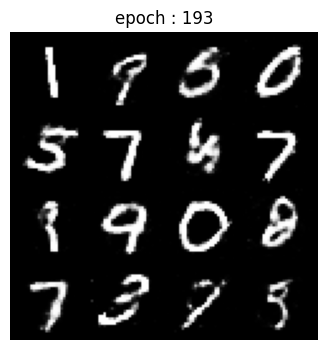

epoch: 193/200 	 D Loss: 0.671 G Loss: 0.832 	 14s


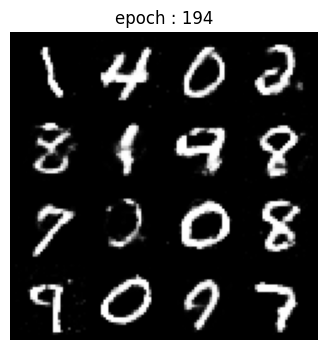

epoch: 194/200 	 D Loss: 0.670 G Loss: 0.823 	 14s


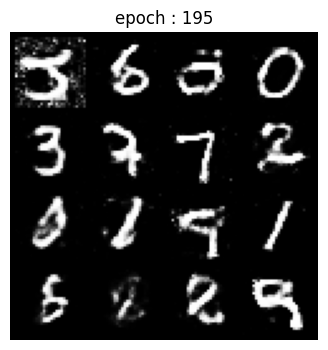

epoch: 195/200 	 D Loss: 0.672 G Loss: 0.823 	 14s


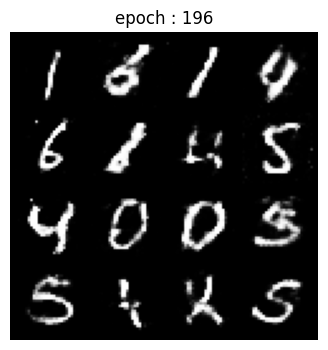

epoch: 196/200 	 D Loss: 0.672 G Loss: 0.818 	 14s


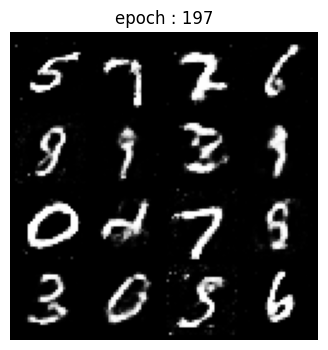

epoch: 197/200 	 D Loss: 0.672 G Loss: 0.822 	 14s


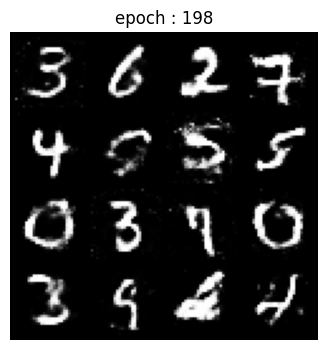

epoch: 198/200 	 D Loss: 0.672 G Loss: 0.816 	 14s


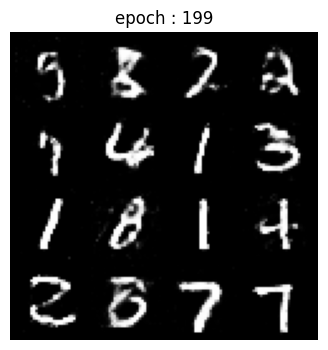

epoch: 199/200 	 D Loss: 0.671 G Loss: 0.822 	 14s


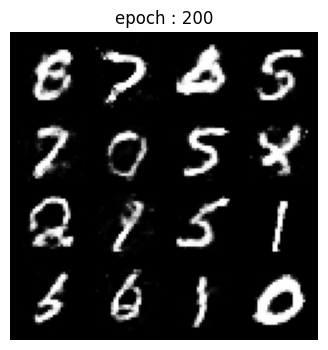

epoch: 200/200 	 D Loss: 0.673 G Loss: 0.813 	 14s
learning time (200 epoch) : 46m 1


In [ ]:
epochs = 200

total_time = list()

d_loss_list = list()
g_loss_list = list()

for epoch in range(epochs):
    now = time()
    d_avg_loss = 0.0
    g_avg_loss = 0.0

    for i, data in enumerate(trainset):
        x, _ = data
        # flatten
        x = x.view(x.size(0), -1).to(device)

        d_optimizer.zero_grad()
        g_optimizer.zero_grad()
        
        batch_size = x.size(0)
        # 0 : fake, 1 : real
        # .unsqueeze(1) : 128, 1 형태로 변환
        # * 0.9 이유 : D 가 확신하지 못하도록 soft labeling (1 대신 0.9)
        # + 0.05 * torch.rand(batch_size, 1) : 0.05 범위의 noise 추가 (fake : 0.0 ~ 0.05 / real : 0.9 ~ 0.95)
        # -> D가 완벽하게 판별하는 것을 방지하여 전체 학습률 안정화
        # label smoothing + label noise
        real_labels = torch.ones(batch_size, device=device).unsqueeze(1) * 0.9 + 0.05 * torch.rand(batch_size, 1, device=device)
        fake_labels = torch.zeros(batch_size, device=device).unsqueeze(1) + 0.05 * torch.rand(batch_size, 1, device=device)

        # D training
        z = torch.randn(batch_size, latent_size, device=device)
        fake_imgs = G(z)

        real_loss = loss_function(D(x), real_labels)
        # Torch.detach : backpropagation에서 다른 tensor (=G) 의 weights 변화를 방지
        fake_loss = loss_function(D(fake_imgs.detach()), fake_labels)
        d_loss = (real_loss + fake_loss) / 2

        d_loss.backward()
        d_optimizer.step()

        # G training
        z = torch.randn(batch_size, latent_size, device=device)
        fake_imgs = G(z)    

        g_loss = loss_function(D(fake_imgs), real_labels)
        g_loss.backward()
        g_optimizer.step()
        
        d_avg_loss += d_loss.item()
        g_avg_loss += g_loss.item()

        d_loss_list.append(d_loss.item())
        g_loss_list.append(g_loss.item())

    learning_time = int(time() - now)
    total_time.append(learning_time)

    # fake image 출력해보기
    fake_images = fake_imgs.detach().view(-1, 1, 28, 28)

    # epoch 당 fake image를 그리드로 출력
    # make_grid(fake_images[:16], nrow=4) : grid 형태로 만들어준다 (4 * 4)
    # normalize=True : tanh 의 출력 (-1 ~ 1) 을 0 ~ 1 범위로 정규화
    # permute(1,2,0) : [channels, height, width] -> [height, width, channels]
    plt.figure(figsize=(4, 4))
    plt.imshow(make_grid(fake_images[:16], nrow=4, normalize=True).cpu().permute(1, 2, 0))
    plt.axis('off')
    plt.title(f"epoch : {epoch+1}")
    plt.show()

    # d loss 와 g loss가 0.698 (log2) 상태에서 진동하는 것이 가장 이상적인 상태
    # -> 이진 분류의 무작위 추측(random guessing)을 할 때의 cross entropy loss 값
    # 내쉬 균형 (nash equilibrium) : G는 real과 거의 비슷한 fake를 생성, D는 real과 fake를 구별하지 못함
    # 모드 붕괴 (mode collapse) : G는 D를 속일 수 있는 한정된 형태만 학습 (다양한 이미지를 생성하지 못함)
    # 기울기 소실 (vanishing gradient) : G가 D의 출력을 바탕으로 역전파를 받는데, D가 너무 완벽하게 구별하여 G 의 gradient 가 0으로 수렴 (학습이 전혀 되지 않음)
    print(f"epoch: {epoch+1:3d}/{epochs} \t D Loss: {d_avg_loss/len(trainset):.3f} G Loss: {g_avg_loss/len(trainset):.3f} \t {learning_time}s")

print(f"learning time ({epochs} epoch) : {floor(sum(total_time) / 60)}m {sum(total_time) % 60}")

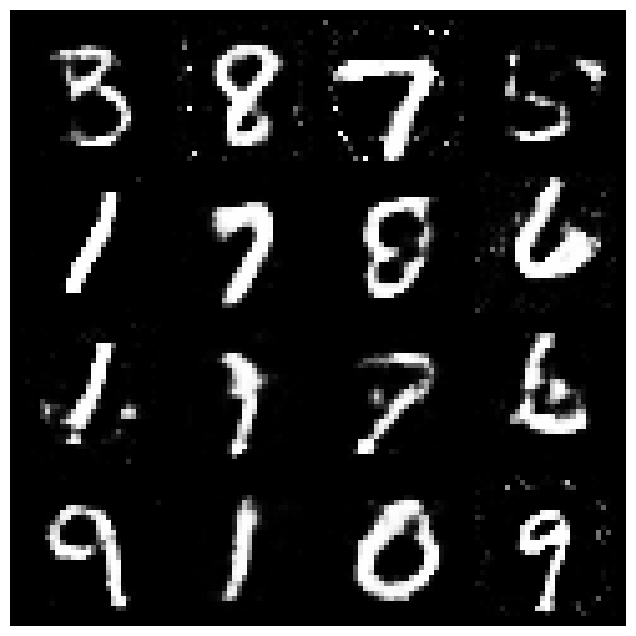

In [12]:
z = torch.randn(batch_size, latent_size).to(device)
fake_images = G(z).detach().view(-1, 1, 28, 28)

plt.figure(figsize=(8, 8))
plt.imshow(make_grid(fake_images[:16], nrow=4, normalize=True).cpu().permute(1,2,0))
plt.axis("off")
plt.show()

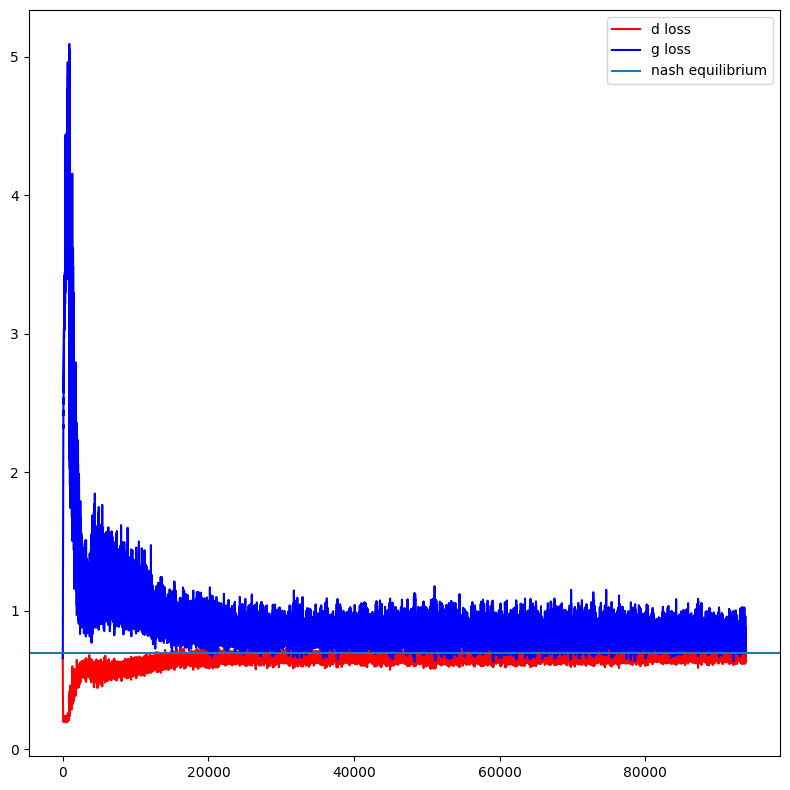

In [13]:
plt.figure(figsize=(8, 8))
plt.plot(range(1, len(d_loss_list) + 1), d_loss_list, label='d loss', color='red')
plt.plot(range(1, len(d_loss_list) + 1), g_loss_list, label='g loss', color='blue')
# loss 값이 log(2) -> 0.693 에 가까울 수록 이상적 (내쉬 균형)  
plt.axhline(y=np.log(2), label='nash equilibrium')
plt.tight_layout()
plt.legend()
plt.show()

그래프 해석 : d loss와 g loss가 어느정도 안정된 진동을 보임 = 학습이 잘 되었다

### ReNet-5 (mnist 분류기) 를 통해 Geneartor가 생성한 image를 분류해보자

In [14]:
from torch.nn import Conv2d, Linear, AvgPool2d, CrossEntropyLoss
from torch.nn.functional import tanh
from collections import Counter
from torch.optim import Adam

In [15]:
# renet-5 : 간단한 image classifier (mnist data 특화)
class LeNet5(Module):
    def __init__(self):
        super().__init__()
        self.conv1 = Conv2d(1, 6, 5, stride=1, padding=2)
        self.pool = AvgPool2d(2)
        self.conv2 = Conv2d(6, 16, 5)
        self.fc1 = Linear(16 * 5 * 5, 120)
        self.fc2 = Linear(120, 84)
        self.fc3 = Linear(84, 10)

    def forward(self, x):
        x = tanh(self.conv1(x))
        x = self.pool(x)
        x = tanh(self.conv2(x))
        x = self.pool(x)
        x = x.view(-1, 16 * 5 * 5)
        x = tanh(self.fc1(x))
        x = tanh(self.fc2(x))
        x = self.fc3(x)
        return x

In [20]:
lenet = LeNet5().to(device)

loss_function = CrossEntropyLoss()
optimizer = Adam(lenet.parameters(), lr=0.001)


In [21]:
for epoch in range(5):
    for x, y in trainset:
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        out = lenet(x)
        loss = loss_function(out, y)
        loss.backward()
        optimizer.step()
    print(f"{epoch + 1} : {loss.item():.3f}")

1 : 0.096
2 : 0.121
3 : 0.047
4 : 0.058
5 : 0.056


In [37]:
lenet.eval()

fake_images = fake_imgs.detach().view(-1, 1, 28, 28).to(device)

with torch.no_grad():
    outputs = lenet(fake_images)
    predict = torch.argmax(outputs, dim=1)

pred_counts = Counter(predict.cpu().numpy())

for cls, count in sorted(pred_counts.items()):
    print(f"Class {cls}: {count}")

Class 0: 8
Class 1: 11
Class 2: 8
Class 3: 8
Class 4: 10
Class 5: 12
Class 6: 9
Class 7: 10
Class 8: 9
Class 9: 11


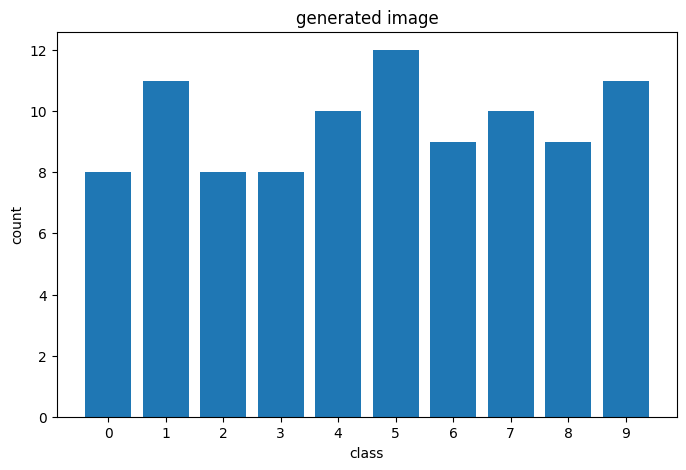

In [38]:
classes = sorted(pred_counts.keys())
counts = [pred_counts[cls] for cls in classes]

plt.figure(figsize=(8,5))
plt.bar(classes, counts)
plt.xlabel('class')
plt.ylabel('count')
plt.title('generated image')
plt.xticks(classes)
plt.show()

그래프 해석 : 생성된 image의 class가 고르게 분포되어있다 = 모드 붕괴가 일어나지 않고 class 별로 학습을 잘 했다